# Preparacion de los datos

In [1]:
from utilities import unpickle, tryDataset, mkfolders, os, compute_mixture, load_mixture

(50000, 32, 32, 3)


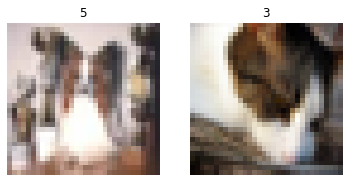

(10000, 32, 32, 3)


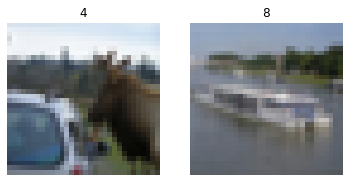

In [2]:
X_train = unpickle("Input\cifar-10-train")
X_test = unpickle("Input\cifar-10-test")
tryDataset(X_train)
tryDataset(X_test)

# Entrenamiento

## Persistencia

In [3]:
_raiz = "Resultados/CIFAR10pruebasAAE"
_nombre = "CIFAR10"

Creamos las carpetas para almacenar el output

In [4]:
mkfolders(_raiz, True)

Carpeta Resultados/CIFAR10pruebasAAE ya existe


## Entrenamiento en grid

In [5]:
from AutoencoderLib import *

Tamaño de la capa latente:

In [6]:
dim_latente_cand = [512, 1024]

Tamaño de las imagenes:

In [7]:
img_shape = X_train["data"][0].shape

Parametros:

In [8]:
discriminators = [(build_discriminator ,"default_disc", {}, {"truth":true_sampler, "truth_kwargs":{}, "falsehood":fake_sampler}),
                    (build_class_discriminator ,"class_disc",{"clases":10}, {"truth":true_sampler_clases, "truth_kwargs":{"nclases":10}, "falsehood":fake_class_sampler})]


ae_losses = [(losses.mean_squared_error, "ae_MSE_loss")]
disc_losses =[(losses.binary_crossentropy, "disc_binXentropy_loss")]

In [9]:
epochs = 12

In [10]:
def tryModel(
    model_name="MODEL", 
    assemble_AAE=assemble_AAE_twoPhased,
    fit_AAE = fit_AAE_twoPhased,
    enc= (build_conv_encoder, "dense_enc", {}), 
    dec = (build_conv_decoder,"dense_dec", {}),
    ae_loss = (losses.mean_squared_error, "ae_MSE_loss"),
    disc = (build_discriminator ,"default_disc", {}, {"truth":true_sampler, "truth_kwargs":{}, "falsehood":fake_sampler}),
    disc_loss = (losses.binary_crossentropy, "disc_binXentropy_loss"),
    dim_latente = 64,
    mixture_data={"override":False, "nombre":"cluster"},
    save=False
    ):
    # Carpeta donde almacenar los resultados
    ruta = _raiz+"\\"+model_name+"\\"+ae_loss[1]+"\\"+disc[1]+"\\"+disc_loss[1]+"\\"+str(dim_latente)
    # Si existen los modelos solo mostrar resultados guardados sin entrenar
    if os.path.isfile(ruta+"/Modelos\\decoder.h5") or os.path.isfile(ruta+"/Modelos\\autoencoder.h5"):
        print(ruta+" ya ha sido entrenada")
        show_prevResults(ruta, epochs=epochs)
        return
    # Crear carpeta
    mkfolders(ruta, True)
    # Intentar cargar datos de mixtura si se trata de un dsicriminador con informacion de clases
    if "clases" in disc[2].keys():
        mixture = load_mixture(ruta="Data/", dataset_name=_nombre, expansion=10, **mixture_data)
        disc[3]["truth_kwargs"].update({"mixture":mixture})
    # Creacion de los modelos
    ck = {"ae_loss": ae_loss[0], "disc_loss":disc_loss[0]}
    aae = assemble_AAE(dim_latente, img_shape, enc_model = enc[0], enc_kwargs=enc[2], dec_model = dec[0], dec_kwargs=dec[2], disc_model = disc[0], disc_kwargs=disc[2], compilation_kwargs=ck)
    # Entrenamiento
    fit_settings = { "epochs":epochs, "ruta" : ruta}
    fit_settings.update(disc[3])
    history = fit_AAE(aae=aae, dim_latente=dim_latente, dataset=X_train, **fit_settings)
    # Obtenemos informacion del numero de clases para mostrar resultados, si no hay se intenta generar una mixtura para mas tarde
    clases=0
    if "clases" in disc[2].keys():
        clases=disc[2]["clases"]
    else:
        compute_mixture(X_train, aae[0], ruta="Data/", dataset_name=_nombre, **mixture_data)
    #Resultados
    print("Historia del entrenamiento:")
    plot_history(history, ruta=ruta, title=ruta)
    print("Imagenes regeneradas desde el set de entrenamiento (arriba originales):")
    sample_imgs(X_train, aae[3], epoch=epochs, nclases=clases, show=True, ruta=ruta, title=ruta+" regeneration", nombre="TRAINSET")
    print("Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):")
    sample_imgs(X_test, aae[3], epoch=epochs, nclases=clases, show=True, ruta=ruta, title=ruta+" regeneration", nombre="TESTSET")
    print("Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):")
    exploraLatente(aae[0], aae[1], "Input\cifar-10-groupedtrain", ruta=ruta, nombre="GenFromLatentTRAINSET")
    print("Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):")
    exploraLatente(aae[0], aae[1], "Input\cifar-10-groupedtest", ruta=ruta, nombre="GenFromLatentTESTSET")
    # Guardado de modelos
    if save:
        mkfolders(ruta+"/Modelos")
        aae[1].save(ruta+"/Modelos\\decoder.h5")
        aae[3].save(ruta+"/Modelos\\autoencoder.h5")


### Entrenamiento de AAE Convolucional - Def depth, 2p train

Sin clases

Carpeta Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL\ae_MSE_loss\default_disc\disc_binXentropy_loss\512 ya existe
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL\ae_MSE_loss\default_disc\disc_binXentropy_loss\512


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.065646, acc: 98.50%] AAE: [mse: 33.186035, b_ce: 0.049899] 49.20s		
E1 <██████████> 100% DISC: [loss: 0.000244, acc: 100.00%] AAE: [mse: 21.814522, b_ce: 0.048619] 41.74s		
E2 <██████████> 100% DISC: [loss: 0.000000, acc: 100.00%] AAE: [mse: 25.449812, b_ce: 0.041705] 38.73s		
E3 <██████████> 100% DISC: [loss: 0.473982, acc: 84.50%] AAE: [mse: 23.862976, b_ce: 0.040088] 38.65s		
E4 <██████████> 100% DISC: [loss: 0.057905, acc: 98.50%] AAE: [mse: 47.298904, b_ce: 0.046567] 38.61s		
E5 <██████████> 100% DISC: [loss: 0.196246, acc: 95.50%] AAE: [mse: 56.606499, b_ce: 0.044340] 38.74s		
E6 <██████████> 100% DISC: [loss: 1.626917, acc: 81.00%] AAE: [mse: 69.288116, b_ce: 0.043514] 39.17s		
E7 <██████████> 100% DISC: [loss: 0.114533, acc: 98.50%] AAE: [mse: 46.676537, b_ce: 0.045301] 42.07s		
E8 <██████████> 100% DISC: [loss: 0.007532, acc: 99.50%] AAE: [mse: 14.356351, b_ce: 0.042273] 39.84s		
E9 <██████████> 100% DISC: [loss: 0.000000, acc: 100.00%] AAE:

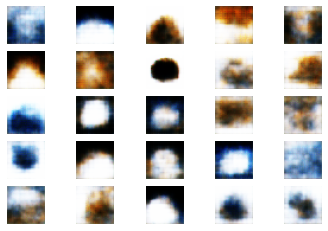

Guardando datos de la mixtura para CIFAR10-512convoCluster
Historia del entrenamiento:


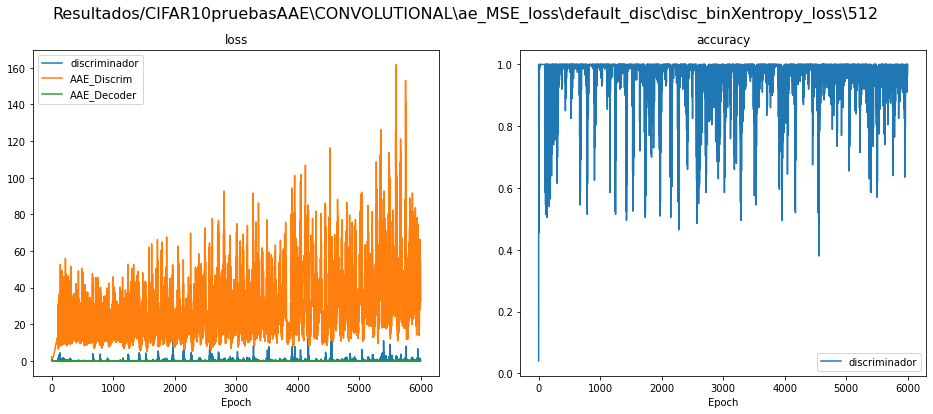

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


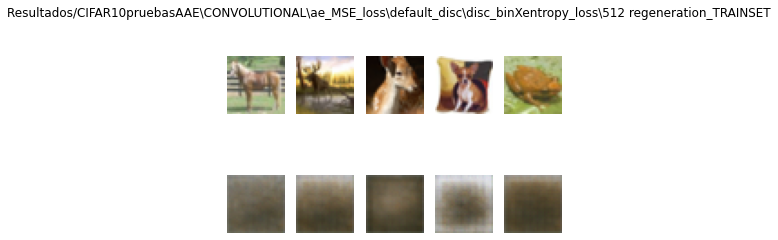

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


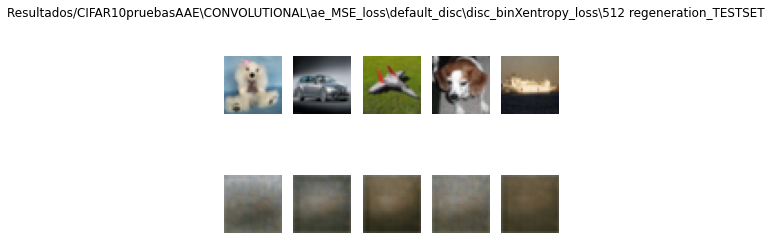

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


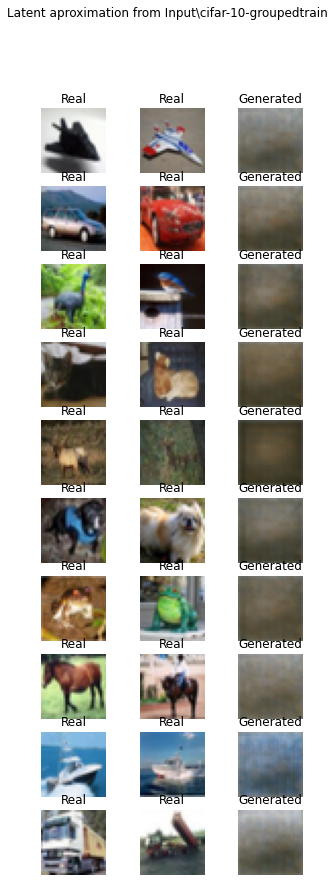

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


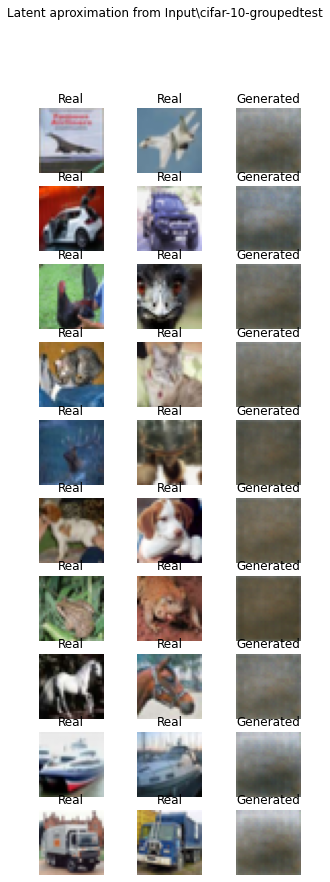

Carpeta Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL\ae_MSE_loss\default_disc\disc_binXentropy_loss\1024 ya existe
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL\ae_MSE_loss\default_disc\disc_binXentropy_loss\1024


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.000144, acc: 100.00%] AAE: [mse: 12.211617, b_ce: 0.053236] 40.77s		
E1 <██████████> 100% DISC: [loss: 0.000065, acc: 100.00%] AAE: [mse: 17.250994, b_ce: 0.046497] 40.09s		
E2 <██████████> 100% DISC: [loss: 0.000992, acc: 100.00%] AAE: [mse: 24.679810, b_ce: 0.051516] 40.01s		
E3 <██████████> 100% DISC: [loss: 0.319591, acc: 94.00%] AAE: [mse: 39.037064, b_ce: 0.055343] 42.84s		
E4 <██████████> 100% DISC: [loss: 0.000548, acc: 100.00%] AAE: [mse: 27.867199, b_ce: 0.045228] 43.86s		
E5 <██████████> 100% DISC: [loss: 0.020854, acc: 99.50%] AAE: [mse: 23.672596, b_ce: 0.054255] 43.00s		
E6 <██████████> 100% DISC: [loss: 0.027015, acc: 99.00%] AAE: [mse: 40.782391, b_ce: 0.058101] 40.79s		
E7 <██████████> 100% DISC: [loss: 0.315477, acc: 97.00%] AAE: [mse: 19.549154, b_ce: 0.038852] 40.30s		
E8 <██████████> 100% DISC: [loss: 0.000001, acc: 100.00%] AAE: [mse: 45.131962, b_ce: 0.041879] 40.51s		
E9 <██████████> 100% DISC: [loss: 0.073969, acc: 99.00%] AA

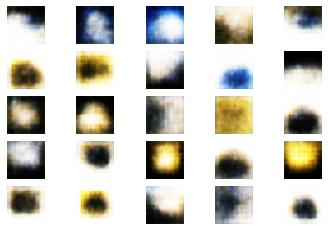

Guardando datos de la mixtura para CIFAR10-1024convoCluster
Historia del entrenamiento:


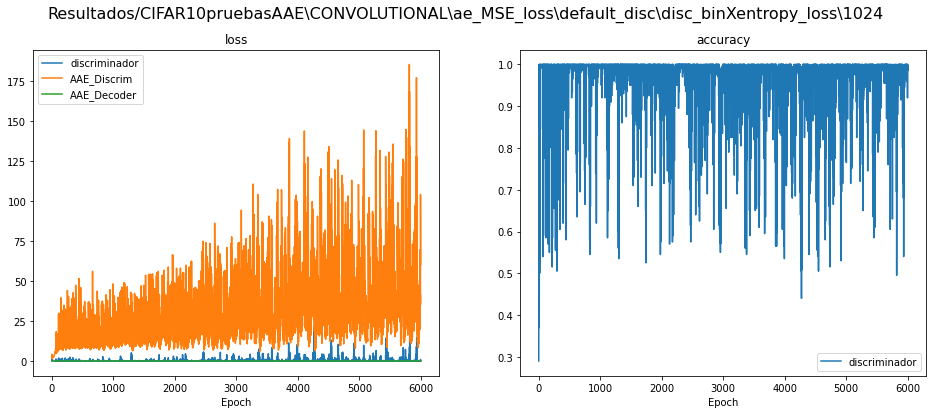

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


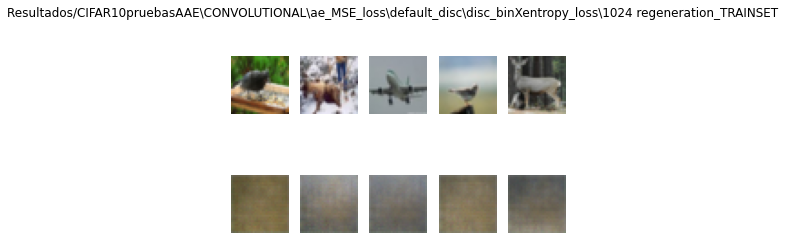

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


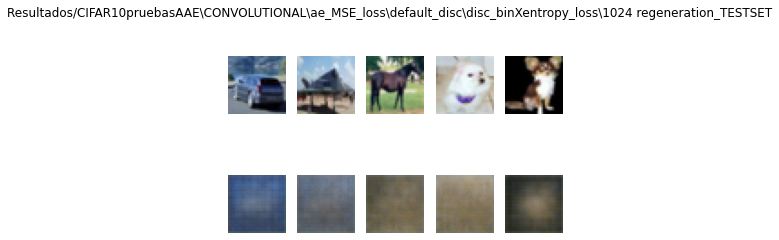

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


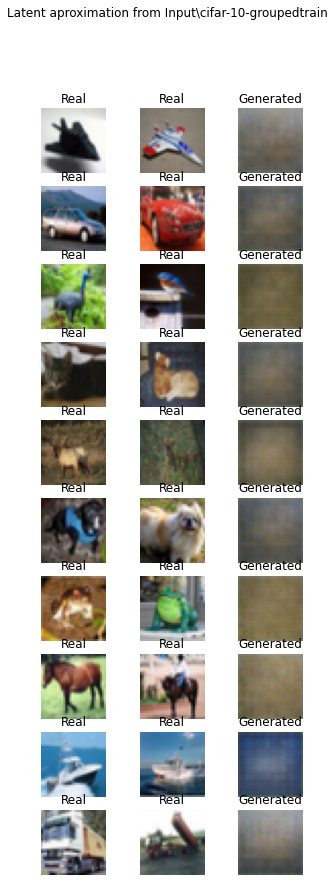

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


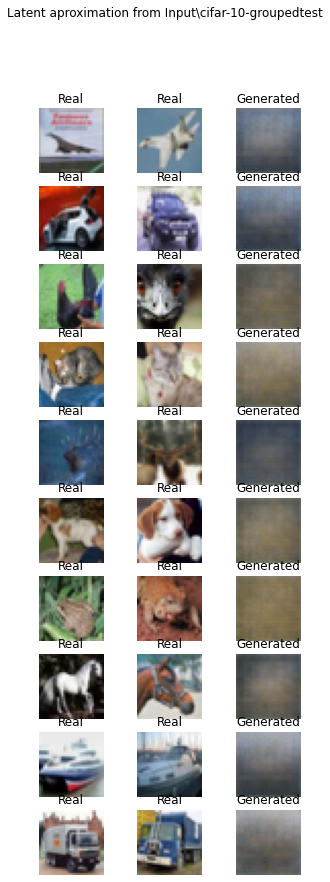

In [11]:
model_name = "CONVOLUTIONAL"

encoder = (build_conv_encoder, "dense_enc", {})
decoder = (build_conv_decoder,"dense_dec", {})
for dim_latente in dim_latente_cand:
    tryModel(enc = encoder, dec=decoder, dim_latente=dim_latente, model_name=model_name, mixture_data={"override":True, "nombre":str(dim_latente)+"convoCluster"})


Con clases

Carpeta Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\512 ya existe
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\512


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.042384, acc: 98.00%] AAE: [mse: 15.627401, b_ce: 0.054367] 39.26s		
E1 <██████████> 100% DISC: [loss: 0.004164, acc: 100.00%] AAE: [mse: 18.028965, b_ce: 0.041666] 38.29s		
E2 <██████████> 100% DISC: [loss: 0.090314, acc: 97.00%] AAE: [mse: 12.462079, b_ce: 0.044022] 38.39s		
E3 <██████████> 100% DISC: [loss: 0.006839, acc: 99.50%] AAE: [mse: 41.039616, b_ce: 0.042705] 38.51s		
E4 <██████████> 100% DISC: [loss: 0.079431, acc: 97.00%] AAE: [mse: 54.478687, b_ce: 0.041061] 38.65s		
E5 <██████████> 100% DISC: [loss: 0.000022, acc: 100.00%] AAE: [mse: 20.091522, b_ce: 0.042667] 38.72s		
E6 <██████████> 100% DISC: [loss: 0.178930, acc: 97.50%] AAE: [mse: 20.374659, b_ce: 0.045428] 38.63s		
E7 <██████████> 100% DISC: [loss: 0.478444, acc: 87.50%] AAE: [mse: 64.898628, b_ce: 0.053693] 40.53s		
E8 <██████████> 100% DISC: [loss: 0.000002, acc: 100.00%] AAE: [mse: 20.014523, b_ce: 0.041139] 38.57s		
E9 <██████████> 100% DISC: [loss: 0.108562, acc: 98.50%] AAE:

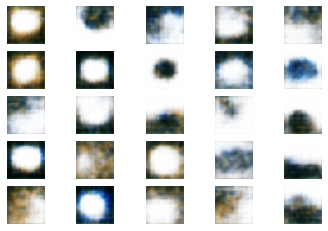

Guardando datos de la mixtura para CIFAR10-512convoCluster
Historia del entrenamiento:


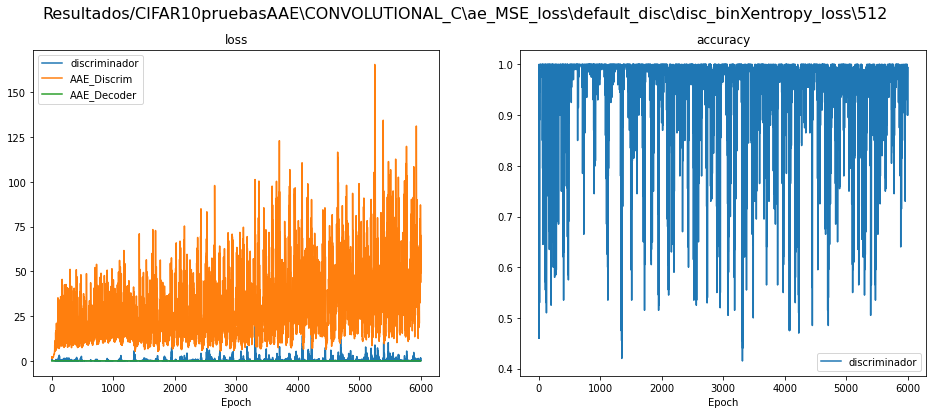

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


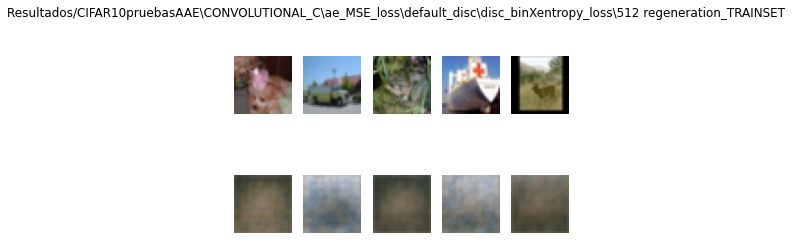

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


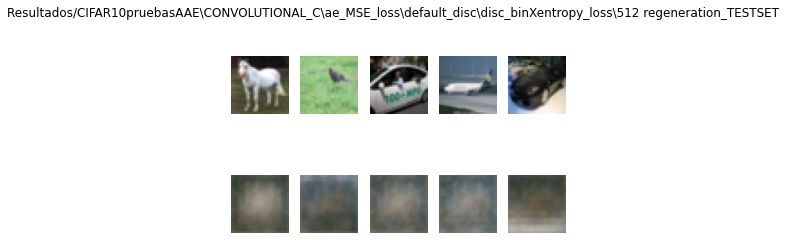

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


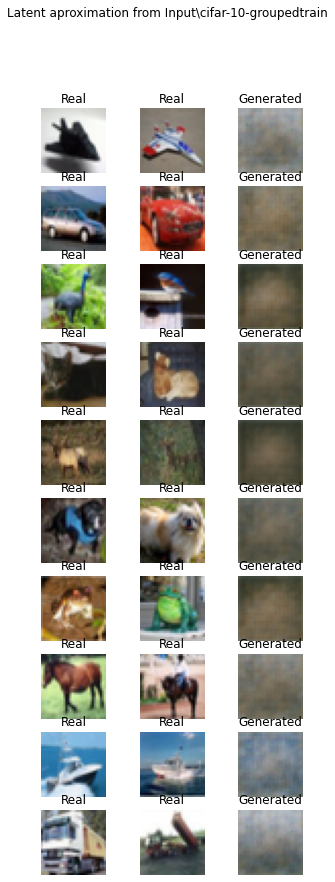

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


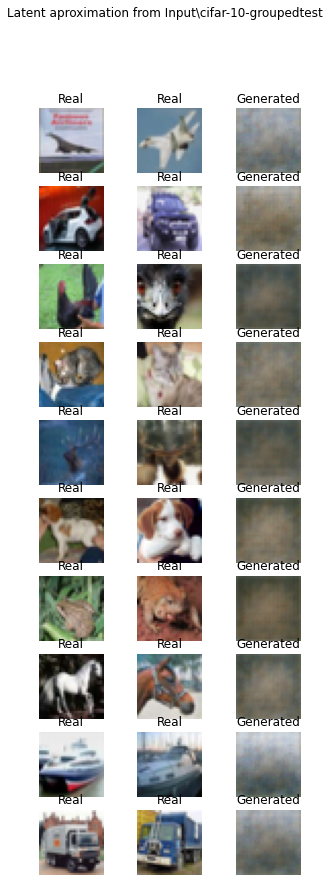

Carpeta Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\1024 ya existe
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\1024


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.005945, acc: 99.50%] AAE: [mse: 16.904455, b_ce: 0.046982] 41.09s		
E1 <██████████> 100% DISC: [loss: 0.891157, acc: 75.50%] AAE: [mse: 27.767654, b_ce: 0.044153] 40.11s		
E2 <██████████> 100% DISC: [loss: 0.012109, acc: 99.50%] AAE: [mse: 17.347506, b_ce: 0.046280] 40.02s		
E3 <██████████> 100% DISC: [loss: 0.000008, acc: 100.00%] AAE: [mse: 20.096907, b_ce: 0.046168] 40.18s		
E4 <██████████> 100% DISC: [loss: 0.135344, acc: 96.00%] AAE: [mse: 29.976479, b_ce: 0.050731] 39.89s		
E5 <██████████> 100% DISC: [loss: 0.002590, acc: 100.00%] AAE: [mse: 24.792015, b_ce: 0.047000] 40.15s		
E6 <██████████> 100% DISC: [loss: 0.001151, acc: 100.00%] AAE: [mse: 17.310850, b_ce: 0.041190] 40.21s		
E7 <██████████> 100% DISC: [loss: 0.013968, acc: 99.50%] AAE: [mse: 21.189445, b_ce: 0.035905] 39.87s		
E8 <██████████> 100% DISC: [loss: 0.002237, acc: 100.00%] AAE: [mse: 15.961845, b_ce: 0.036331] 39.79s		
E9 <██████████> 100% DISC: [loss: 0.000151, acc: 100.00%] AA

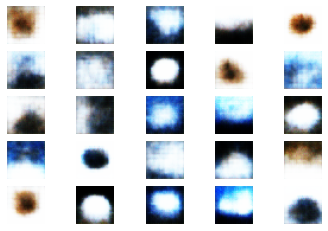

Guardando datos de la mixtura para CIFAR10-1024convoCluster
Historia del entrenamiento:


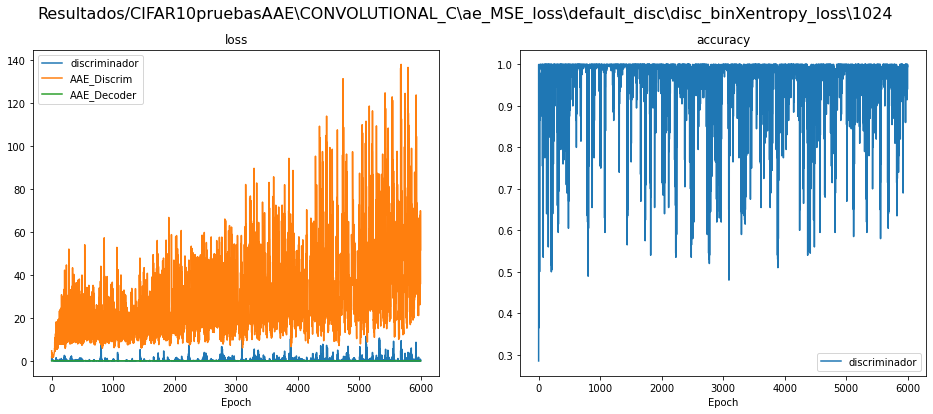

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


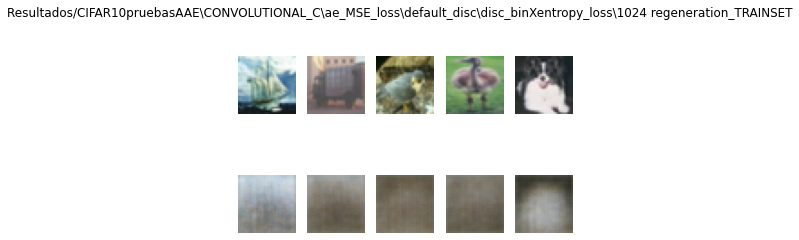

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


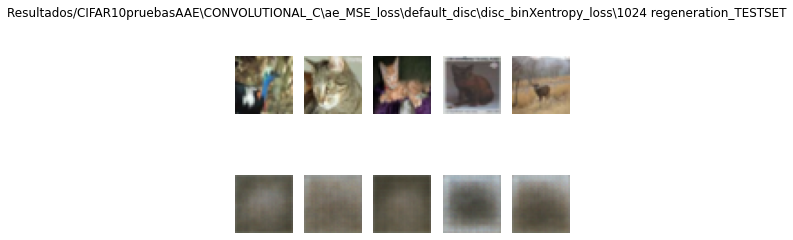

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


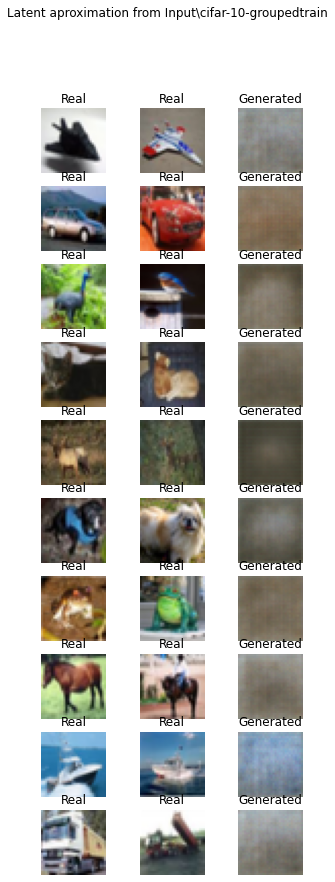

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


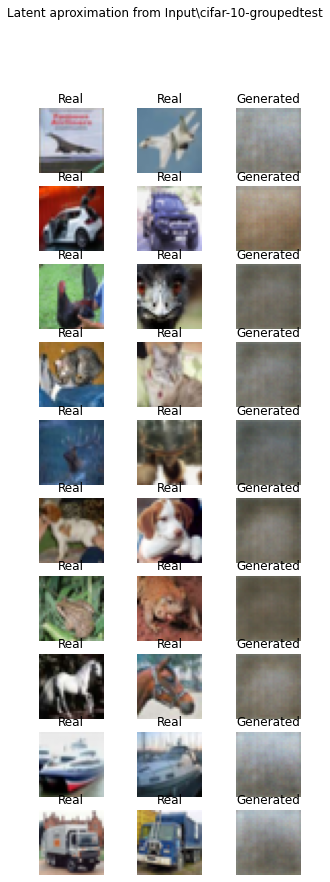

In [12]:
discriminator = (build_class_discriminator ,"class_disc",{"clases":10}, {"truth":true_sampler_clases, "truth_kwargs":{"nclases":10}, "falsehood":fake_class_sampler})
model_name = "CONVOLUTIONAL_C"

encoder = (build_conv_encoder, "dense_enc", {})
decoder = (build_conv_decoder,"dense_dec", {})
for dim_latente in dim_latente_cand:
    tryModel(enc = encoder, dec=decoder, dim_latente=dim_latente, model_name=model_name, mixture_data={"override":True, "nombre":str(dim_latente)+"convoCluster"})

Con clases(cluster)

Carpeta Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\512 ya existe
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\512


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.033920, acc: 99.50%] AAE: [mse: 8.814632, b_ce: 0.047216] 39.34s			
E1 <██████████> 100% DISC: [loss: 0.120274, acc: 97.50%] AAE: [mse: 7.469923, b_ce: 0.052269] 38.41s			
E2 <██████████> 100% DISC: [loss: 0.002657, acc: 100.00%] AAE: [mse: 12.215265, b_ce: 0.068595] 38.35s		
E3 <██████████> 100% DISC: [loss: 0.032973, acc: 98.50%] AAE: [mse: 17.526848, b_ce: 0.044692] 38.57s		
E4 <██████████> 100% DISC: [loss: 3.588588, acc: 69.00%] AAE: [mse: 69.445290, b_ce: 0.049513] 38.53s		
E5 <██████████> 100% DISC: [loss: 0.004325, acc: 100.00%] AAE: [mse: 15.730429, b_ce: 0.045386] 38.14s		
E6 <██████████> 100% DISC: [loss: 0.077065, acc: 97.50%] AAE: [mse: 28.527857, b_ce: 0.038878] 38.09s		
E7 <██████████> 100% DISC: [loss: 0.001054, acc: 100.00%] AAE: [mse: 10.833654, b_ce: 0.043728] 38.11s		
E8 <██████████> 100% DISC: [loss: 0.000904, acc: 100.00%] AAE: [mse: 27.622368, b_ce: 0.035036] 38.35s		
E9 <██████████> 100% DISC: [loss: 0.030443, acc: 98.50%] AAE

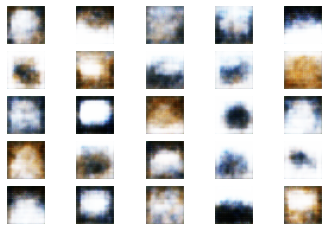

Guardando datos de la mixtura para CIFAR10-512convoCluster
Historia del entrenamiento:


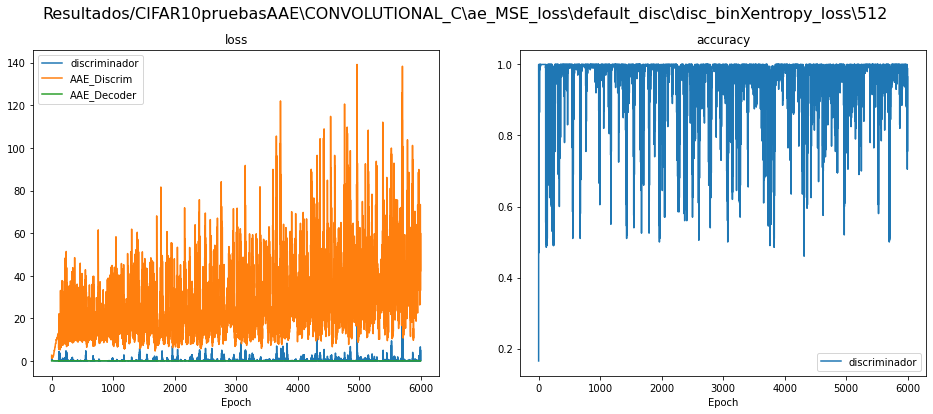

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


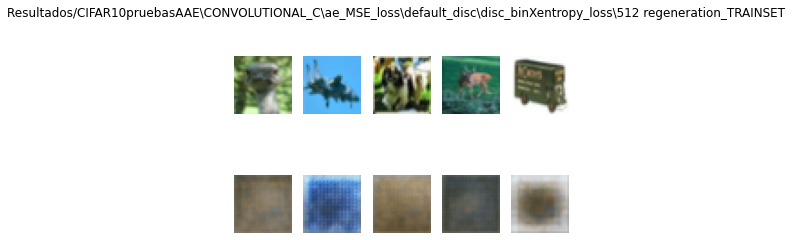

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


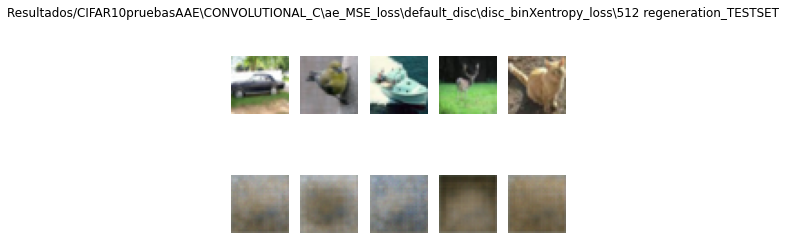

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


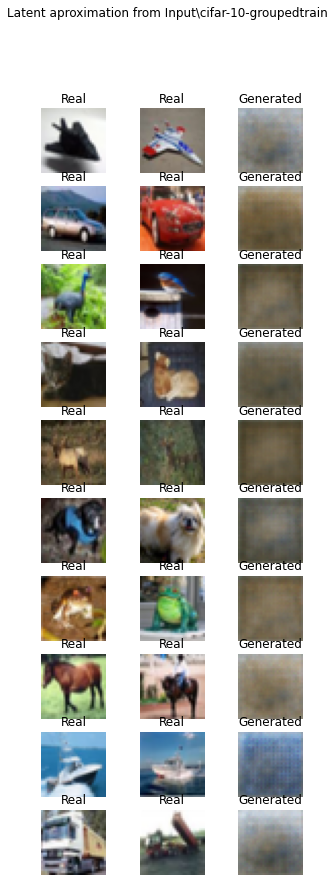

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


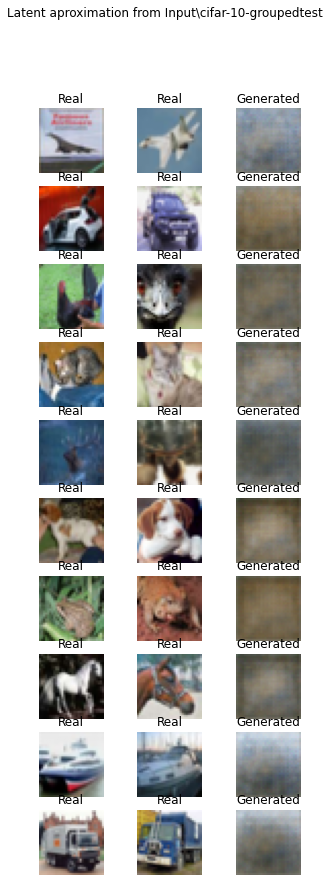

Carpeta Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\1024 ya existe
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\1024


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.000276, acc: 100.00%] AAE: [mse: 14.301001, b_ce: 0.047518] 40.72s		
E1 <██████████> 100% DISC: [loss: 0.017842, acc: 98.50%] AAE: [mse: 15.892196, b_ce: 0.045159] 40.03s		
E2 <██████████> 100% DISC: [loss: 0.001746, acc: 100.00%] AAE: [mse: 11.349382, b_ce: 0.048776] 40.24s		
E3 <██████████> 100% DISC: [loss: 0.027270, acc: 99.50%] AAE: [mse: 25.215046, b_ce: 0.044116] 40.02s		
E4 <██████████> 100% DISC: [loss: 0.035955, acc: 99.50%] AAE: [mse: 49.982986, b_ce: 0.051304] 39.69s		
E5 <██████████> 100% DISC: [loss: 0.388888, acc: 96.00%] AAE: [mse: 59.840347, b_ce: 0.044146] 39.94s		
E6 <██████████> 100% DISC: [loss: 0.011875, acc: 99.50%] AAE: [mse: 14.808313, b_ce: 0.049661] 39.99s		
E7 <██████████> 100% DISC: [loss: 0.000166, acc: 100.00%] AAE: [mse: 29.112185, b_ce: 0.036484] 40.10s		
E8 <██████████> 100% DISC: [loss: 0.261191, acc: 94.00%] AAE: [mse: 24.960949, b_ce: 0.041596] 39.86s		
E9 <██████████> 100% DISC: [loss: 0.015286, acc: 99.00%] AAE:

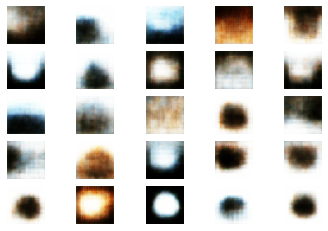

Guardando datos de la mixtura para CIFAR10-1024convoCluster
Historia del entrenamiento:


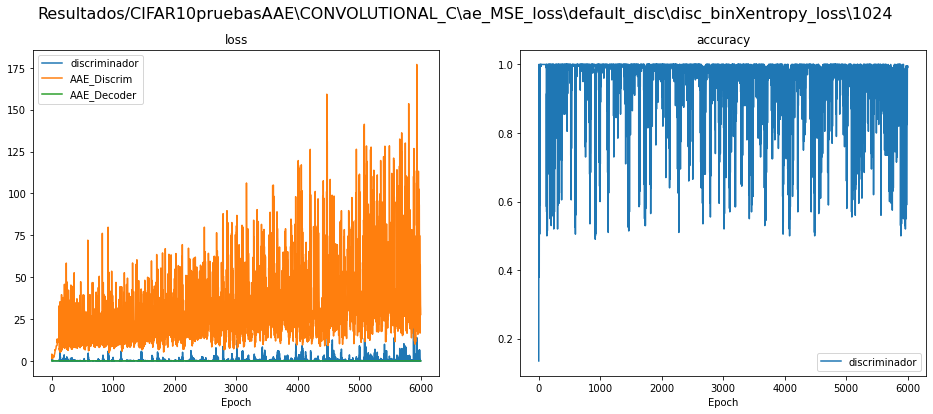

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


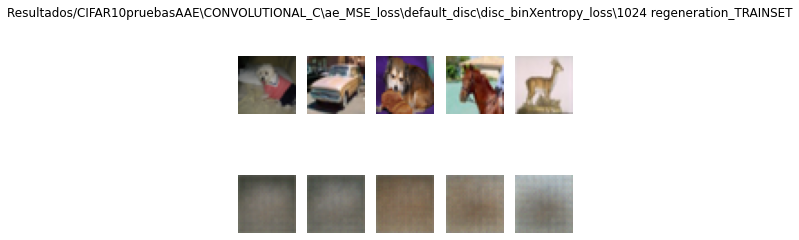

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


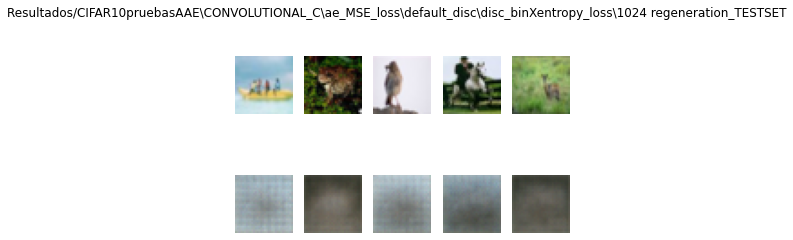

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


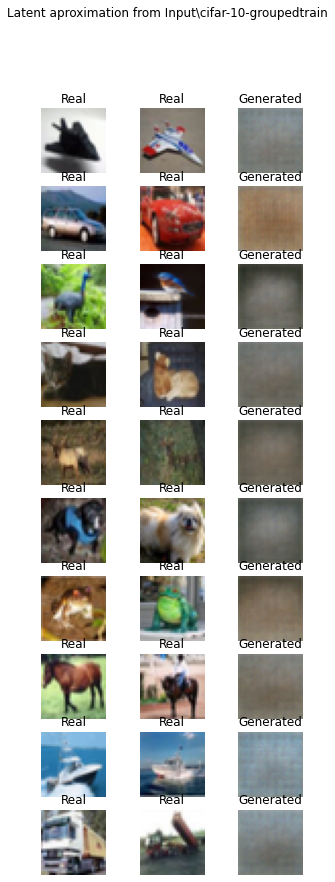

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


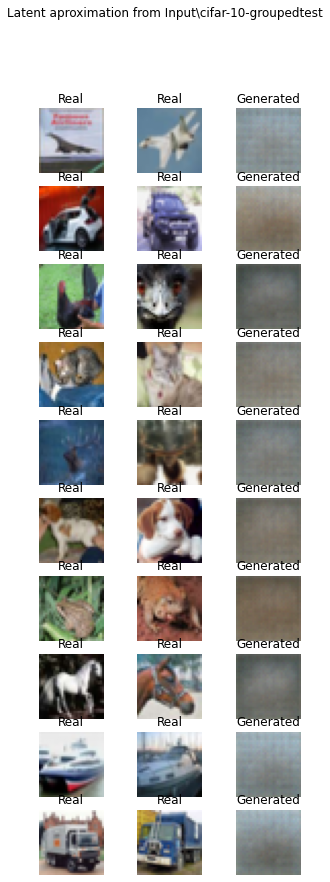

In [13]:

discriminator = (build_class_discriminator ,"class_disc",{"clases":10}, {"truth":genFromMixture, "truth_kwargs":{"nclases":10}, "falsehood":fake_class_sampler})
model_name = "CONVOLUTIONAL_C"

encoder = (build_conv_encoder, "dense_enc", {})
decoder = (build_conv_decoder,"dense_dec", {})
for dim_latente in dim_latente_cand:
    tryModel(enc = encoder, dec=decoder, dim_latente=dim_latente, model_name=model_name, mixture_data={"override":True, "nombre":str(dim_latente)+"convoCluster"})

### Entrenamiento de AAE Convolucional - 3 depth, 2p train

Sin clases

Carpeta Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL\ae_MSE_loss\default_disc\disc_binXentropy_loss\512 ya existe
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL\ae_MSE_loss\default_disc\disc_binXentropy_loss\512


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.082673, acc: 96.50%] AAE: [mse: 39.491989, b_ce: 0.056973] 49.22s		
E1 <██████████> 100% DISC: [loss: 0.004861, acc: 100.00%] AAE: [mse: 10.765467, b_ce: 0.044208] 38.93s		
E2 <██████████> 100% DISC: [loss: 0.002404, acc: 100.00%] AAE: [mse: 21.659691, b_ce: 0.051869] 39.46s		
E3 <██████████> 100% DISC: [loss: 0.328599, acc: 83.50%] AAE: [mse: 20.009283, b_ce: 0.040120] 39.36s		
E4 <██████████> 100% DISC: [loss: 0.083895, acc: 97.00%] AAE: [mse: 19.088526, b_ce: 0.036665] 39.28s		
E5 <██████████> 100% DISC: [loss: 0.011123, acc: 99.50%] AAE: [mse: 8.614228, b_ce: 0.041444] 38.89s		
E6 <██████████> 100% DISC: [loss: 0.468867, acc: 86.00%] AAE: [mse: 24.984491, b_ce: 0.041353] 39.00s		
E7 <██████████> 100% DISC: [loss: 0.029007, acc: 99.00%] AAE: [mse: 10.714503, b_ce: 0.044440] 38.90s		
E8 <██████████> 100% DISC: [loss: 0.387711, acc: 93.00%] AAE: [mse: 34.012905, b_ce: 0.041317] 38.92s		
E9 <██████████> 100% DISC: [loss: 0.103360, acc: 99.00%] AAE: [

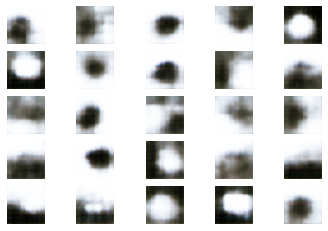

Guardando datos de la mixtura para CIFAR10-512convo3Cluster
Historia del entrenamiento:


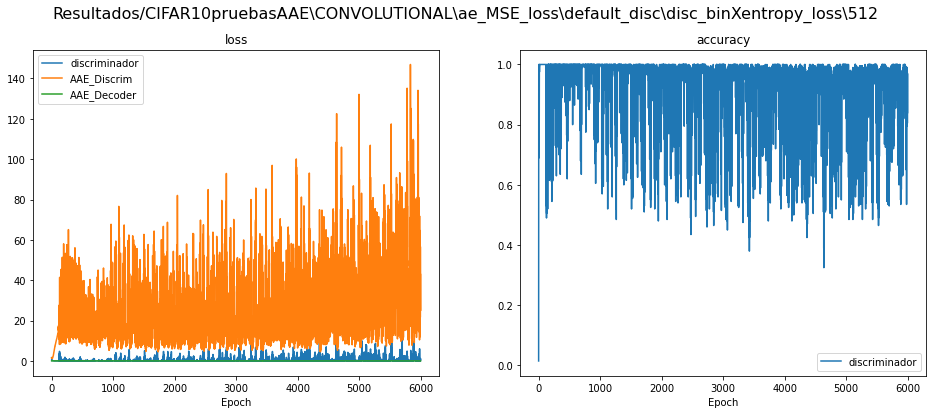

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


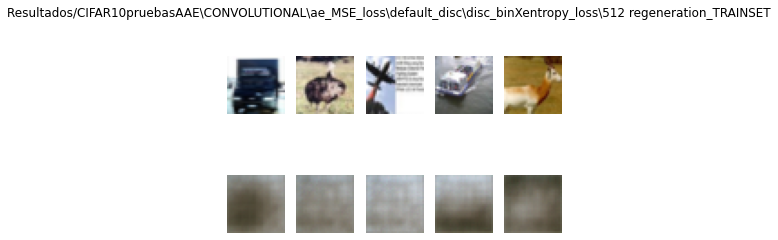

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


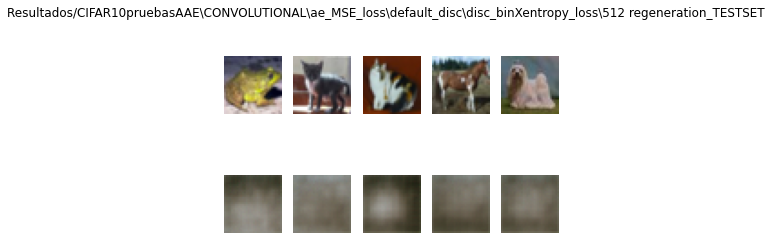

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


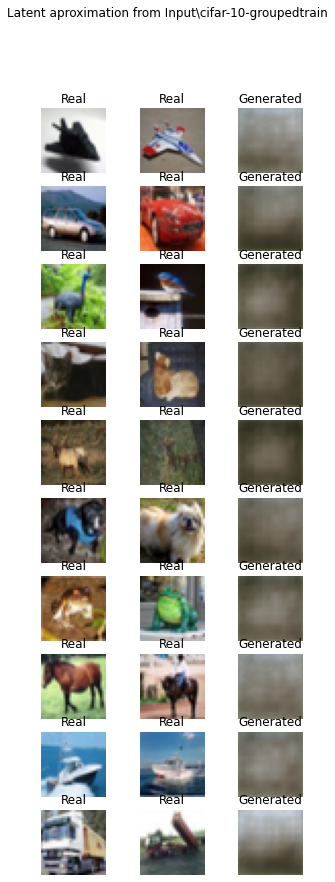

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


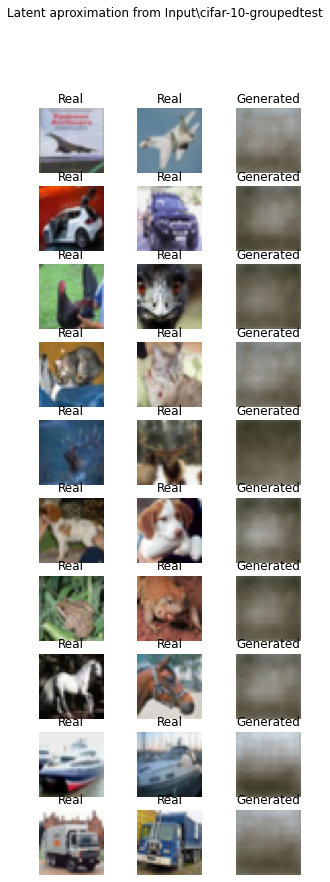

Carpeta Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL\ae_MSE_loss\default_disc\disc_binXentropy_loss\1024 ya existe
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL\ae_MSE_loss\default_disc\disc_binXentropy_loss\1024


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.063650, acc: 98.00%] AAE: [mse: 18.372454, b_ce: 0.050832] 41.34s		
E1 <██████████> 100% DISC: [loss: 0.050084, acc: 99.00%] AAE: [mse: 29.498652, b_ce: 0.048962] 40.42s		
E2 <██████████> 100% DISC: [loss: 0.224958, acc: 89.50%] AAE: [mse: 41.673782, b_ce: 0.048222] 40.55s		
E3 <██████████> 100% DISC: [loss: 0.153498, acc: 96.00%] AAE: [mse: 34.796993, b_ce: 0.044518] 40.07s		
E4 <██████████> 100% DISC: [loss: 0.096757, acc: 98.00%] AAE: [mse: 49.560169, b_ce: 0.050477] 40.70s		
E5 <██████████> 100% DISC: [loss: 0.001980, acc: 100.00%] AAE: [mse: 45.864605, b_ce: 0.045442] 41.00s		
E6 <██████████> 100% DISC: [loss: 0.037218, acc: 99.50%] AAE: [mse: 40.380569, b_ce: 0.041659] 40.37s		
E7 <██████████> 100% DISC: [loss: 0.202316, acc: 95.00%] AAE: [mse: 51.557159, b_ce: 0.043884] 40.01s		
E8 <██████████> 100% DISC: [loss: 0.048992, acc: 98.50%] AAE: [mse: 9.184848, b_ce: 0.043007] 39.75s			
E9 <██████████> 100% DISC: [loss: 0.264307, acc: 95.50%] AAE: [

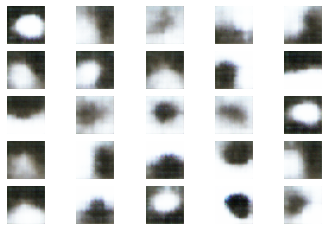

Guardando datos de la mixtura para CIFAR10-1024convo3Cluster
Historia del entrenamiento:


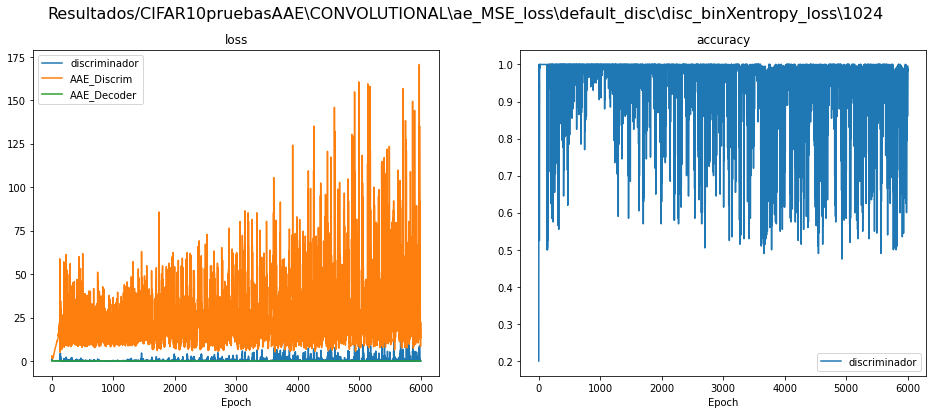

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


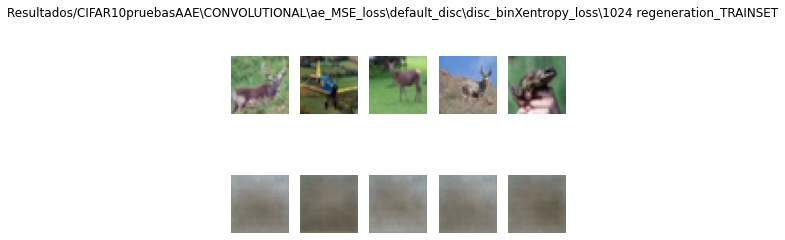

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


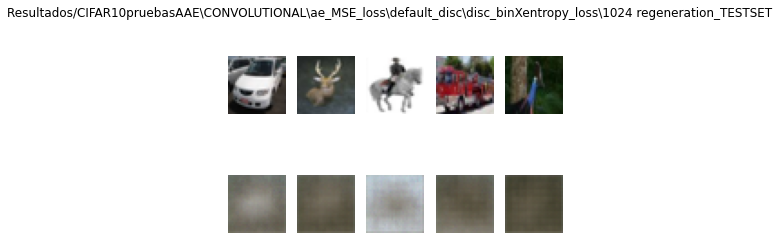

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


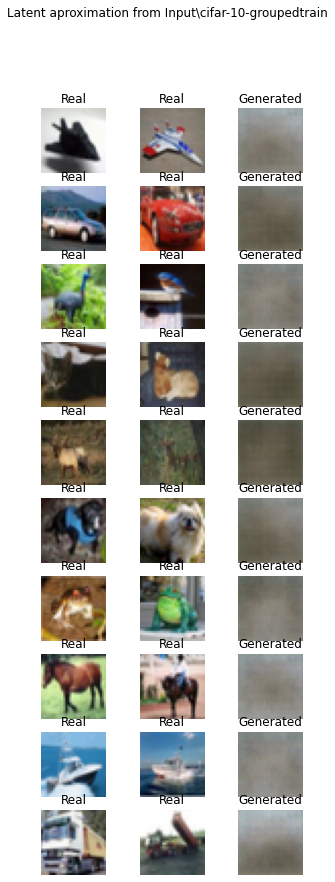

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


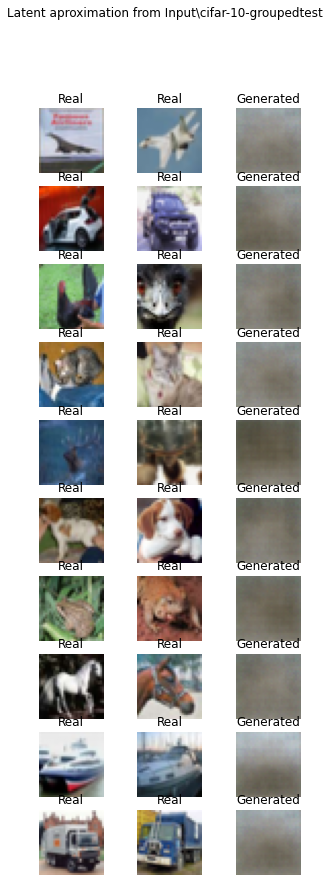

In [11]:
model_name = "CONVOLUTIONAL"

encoder = (build_conv_encoder, "dense_enc", {"depth":3})
decoder = (build_conv_decoder,"dense_dec", {"depth":3})
for dim_latente in dim_latente_cand:
    tryModel(enc = encoder, dec=decoder, dim_latente=dim_latente, model_name=model_name, mixture_data={"override":True, "nombre":str(dim_latente)+"convo3Cluster"})


Con clases

Carpeta Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\512 ya existe
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\512


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.028327, acc: 99.50%] AAE: [mse: 7.067560, b_ce: 0.049903] 40.14s			
E1 <██████████> 100% DISC: [loss: 0.002390, acc: 100.00%] AAE: [mse: 25.291243, b_ce: 0.045537] 38.73s		
E2 <██████████> 100% DISC: [loss: 0.028773, acc: 99.50%] AAE: [mse: 8.145178, b_ce: 0.042986] 38.70s		
E3 <██████████> 100% DISC: [loss: 0.016464, acc: 99.50%] AAE: [mse: 11.216242, b_ce: 0.039829] 38.74s		
E4 <██████████> 100% DISC: [loss: 0.066502, acc: 99.00%] AAE: [mse: 36.333382, b_ce: 0.042821] 40.61s		
E5 <██████████> 100% DISC: [loss: 0.002684, acc: 100.00%] AAE: [mse: 16.014837, b_ce: 0.043379] 43.02s		
E6 <██████████> 100% DISC: [loss: 0.014636, acc: 100.00%] AAE: [mse: 9.246339, b_ce: 0.038090] 41.39s		
E7 <██████████> 100% DISC: [loss: 0.013697, acc: 99.00%] AAE: [mse: 13.837255, b_ce: 0.037181] 38.27s		
E8 <██████████> 100% DISC: [loss: 0.015437, acc: 99.00%] AAE: [mse: 11.965588, b_ce: 0.052116] 36.62s		
E9 <██████████> 100% DISC: [loss: 0.086656, acc: 97.00%] AAE: [

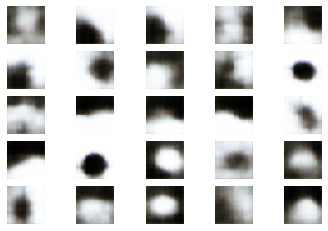

Historia del entrenamiento:


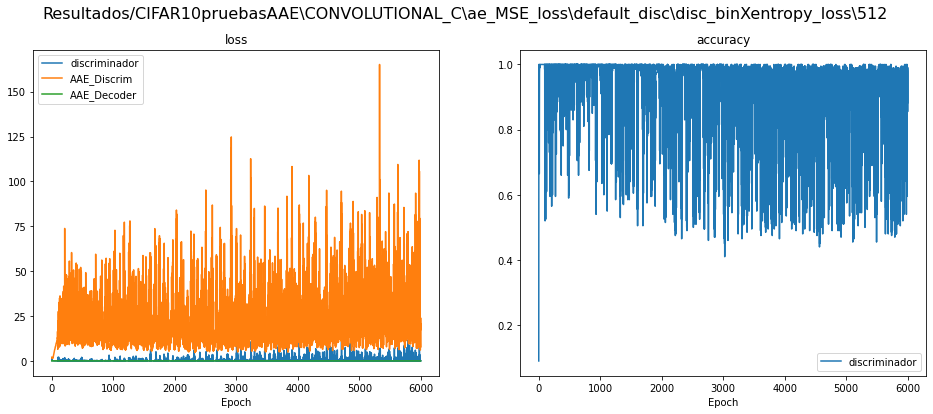

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


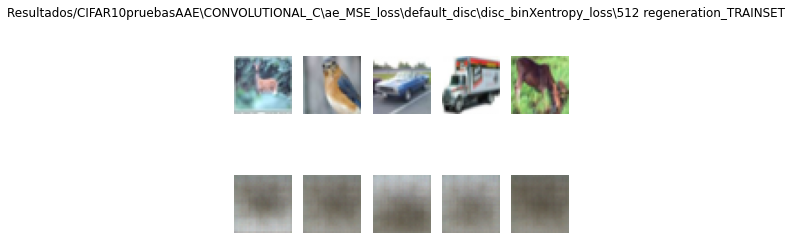

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


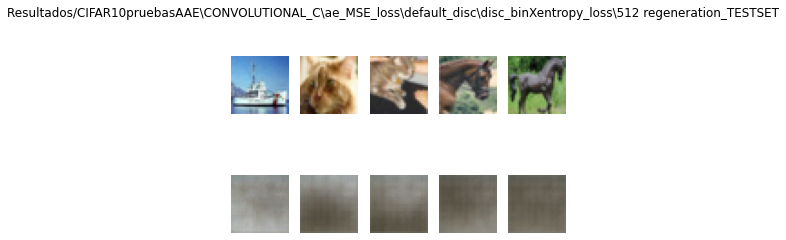

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


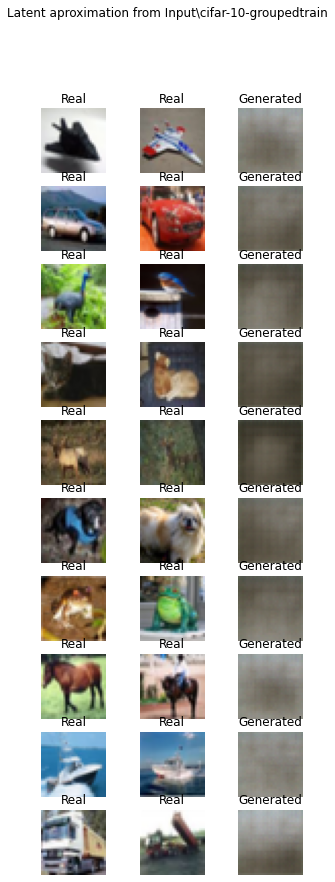

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


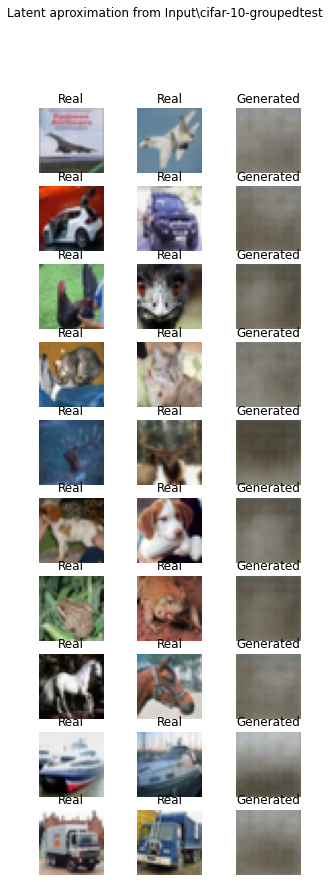

Carpeta Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\1024 ya existe
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\1024


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.003019, acc: 100.00%] AAE: [mse: 7.962320, b_ce: 0.051336] 41.27s		
E1 <██████████> 100% DISC: [loss: 0.001289, acc: 100.00%] AAE: [mse: 23.285084, b_ce: 0.053674] 40.44s		
E2 <██████████> 100% DISC: [loss: 0.001140, acc: 100.00%] AAE: [mse: 24.368690, b_ce: 0.042165] 40.44s		
E3 <██████████> 100% DISC: [loss: 0.003811, acc: 100.00%] AAE: [mse: 24.597834, b_ce: 0.048691] 40.74s		
E4 <██████████> 100% DISC: [loss: 0.132394, acc: 95.50%] AAE: [mse: 18.325453, b_ce: 0.039459] 40.38s		
E5 <██████████> 100% DISC: [loss: 1.977014, acc: 68.00%] AAE: [mse: 72.742104, b_ce: 0.049502] 40.23s		
E6 <██████████> 100% DISC: [loss: 0.032321, acc: 99.00%] AAE: [mse: 12.615692, b_ce: 0.047532] 40.11s		
E7 <██████████> 100% DISC: [loss: 0.092183, acc: 97.00%] AAE: [mse: 21.613876, b_ce: 0.037824] 39.91s		
E8 <██████████> 100% DISC: [loss: 0.015212, acc: 99.00%] AAE: [mse: 24.637114, b_ce: 0.050231] 39.93s		
E9 <██████████> 100% DISC: [loss: 0.123746, acc: 97.50%] AAE:

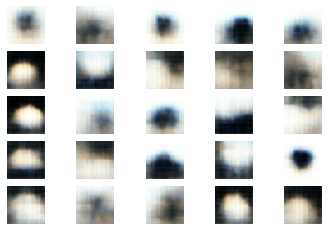

Historia del entrenamiento:


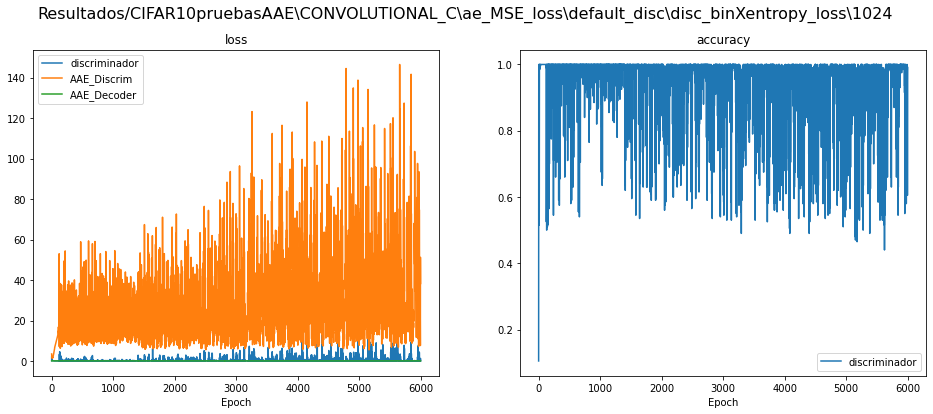

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


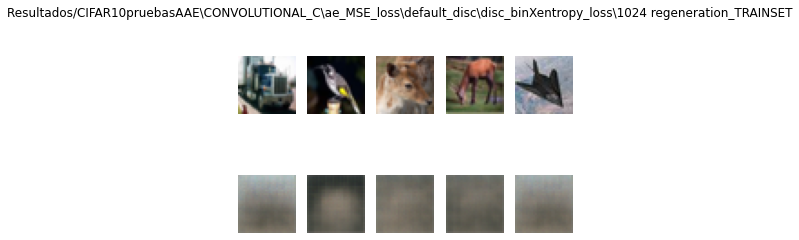

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


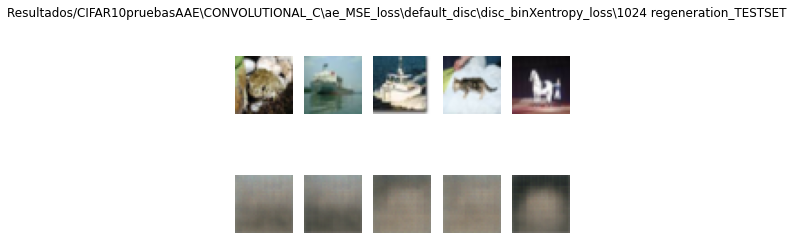

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


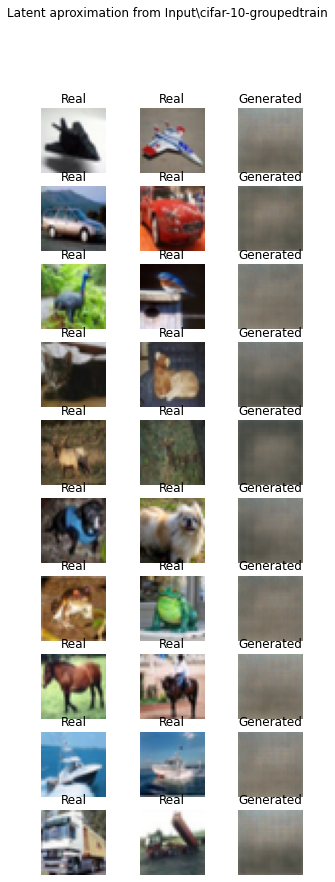

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


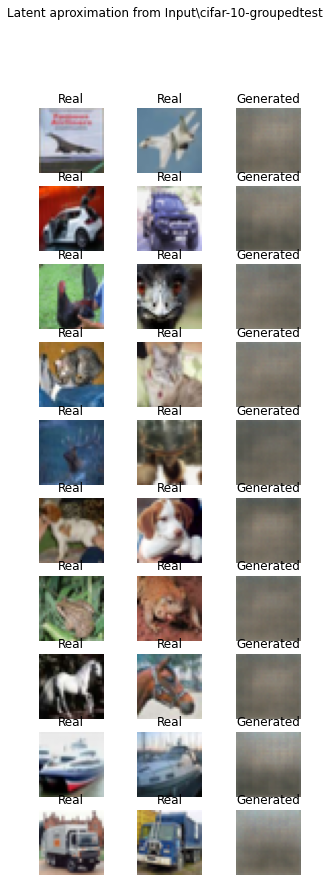

In [12]:
discriminator = (build_class_discriminator ,"class_disc",{"clases":10}, {"truth":true_sampler_clases, "truth_kwargs":{"nclases":10}, "falsehood":fake_class_sampler})
model_name = "CONVOLUTIONAL_C"

encoder = (build_conv_encoder, "dense_enc", {"depth":3})
decoder = (build_conv_decoder,"dense_dec", {"depth":3})
for dim_latente in dim_latente_cand:
    tryModel(enc = encoder, dec=decoder, dim_latente=dim_latente, model_name=model_name, mixture_data={"override":False, "nombre":str(dim_latente)+"convo3Cluster"})

Con clases(cluster)

In [13]:

discriminator = (build_class_discriminator ,"class_disc",{"clases":10}, {"truth":genFromMixture, "truth_kwargs":{"nclases":10}, "falsehood":fake_class_sampler})
model_name = "CONVOLUTIONAL_C"

encoder = (build_conv_encoder, "dense_enc", {"depth":3})
decoder = (build_conv_decoder,"dense_dec", {"depth":3})
for dim_latente in dim_latente_cand:
    tryModel(enc = encoder, dec=decoder, dim_latente=dim_latente, model_name=model_name, mixture_data={"override":False, "nombre":str(dim_latente)+"convo3Cluster"})

Carpeta Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\512 ya existe
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\512


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.054140, acc: 98.00%] AAE: [mse: 20.759829, b_ce: 0.050052] 40.67s		
E1 <██████████> 100% DISC: [loss: 0.000159, acc: 100.00%] AAE: [mse: 14.709722, b_ce: 0.038165] 39.15s		


KeyboardInterrupt: 

### Entrenamiento de AAE Convolucional - Def depth, 3p train

Sin clases

Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_3Phase\ae_MSE_loss\default_disc\disc_binXentropy_loss\512
E0 <██████████> 100% DISC: [loss: 0.004787, acc: 100.00%] AE: [loss: 0.054329] EN-DI [acc: 0.00%] 43.78s		
E1 <██████████> 100% DISC: [loss: 0.038372, acc: 99.00%] AE: [loss: 0.046677] EN-DI [acc: 0.00%] 42.31s		
E2 <██████████> 100% DISC: [loss: 0.000300, acc: 100.00%] AE: [loss: 0.043277] EN-DI [acc: 0.00%] 41.90s		
E3 <██████████> 100% DISC: [loss: 0.177208, acc: 94.50%] AE: [loss: 0.037755] EN-DI [acc: 0.00%] 41.95s		
E4 <██████████> 100% DISC: [loss: 0.053134, acc: 99.00%] AE: [loss: 0.045167] EN-DI [acc: 3.00%] 41.91s		
E5 <██████████> 100% DISC: [loss: 0.335059, acc: 90.50%] AE: [loss: 0.043051] EN-DI [acc: 0.00%] 42.81s		
E6 <██████████> 100% DISC: [loss: 0.033455, acc: 98.50%] AE: [loss: 0.043797] EN-DI [acc: 0.00%] 46.43s		
E7 <██████████> 100% DISC: [loss: 0.823156, acc: 78.50%] AE: [loss: 0.035716] EN-DI [acc: 0.00%] 45.26s		
E8 <██████████> 100% DISC: [loss: 0.1

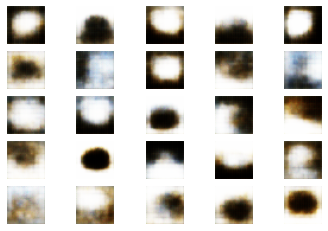

Guardando datos de la mixtura para CIFAR10-512convoCluster
Historia del entrenamiento:


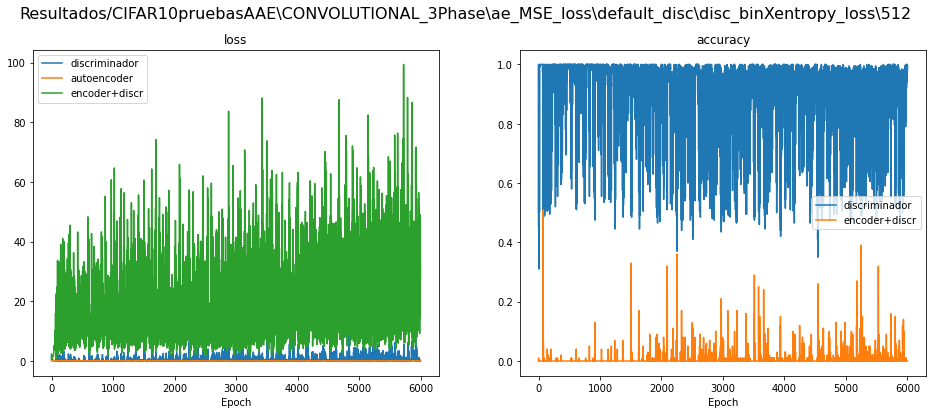

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


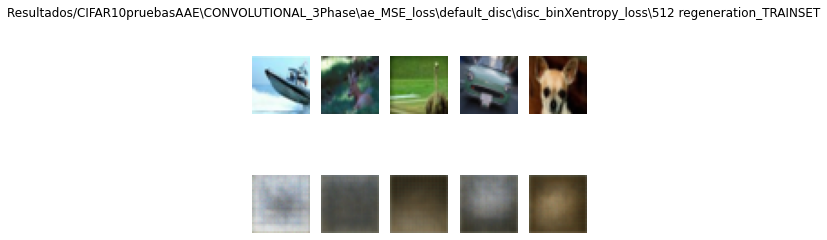

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


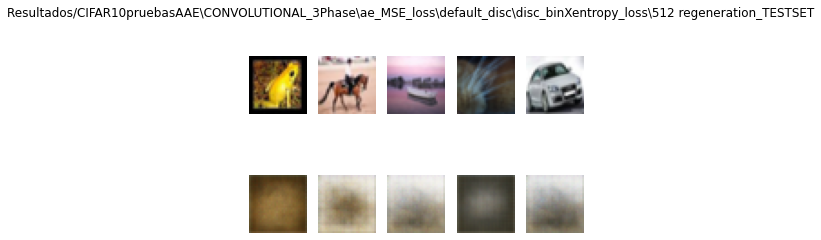

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


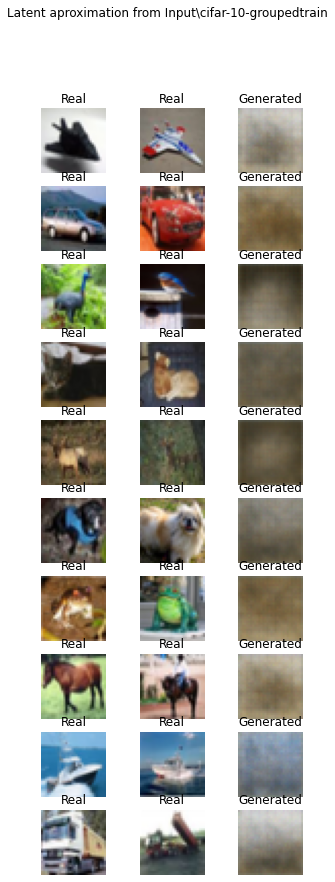

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


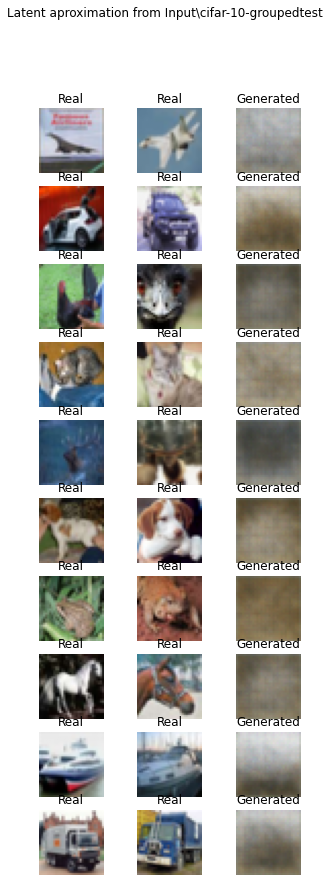

Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_3Phase\ae_MSE_loss\default_disc\disc_binXentropy_loss\1024


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.001414, acc: 100.00%] AE: [loss: 0.053214] EN-DI [acc: 0.00%] 45.64s		
E1 <██████████> 100% DISC: [loss: 0.051692, acc: 97.50%] AE: [loss: 0.049030] EN-DI [acc: 0.00%] 45.28s		
E2 <██████████> 100% DISC: [loss: 0.010388, acc: 99.50%] AE: [loss: 0.048843] EN-DI [acc: 0.00%] 44.32s		
E3 <██████████> 100% DISC: [loss: 0.034480, acc: 99.00%] AE: [loss: 0.046546] EN-DI [acc: 0.00%] 43.59s		
E4 <██████████> 100% DISC: [loss: 0.220383, acc: 96.50%] AE: [loss: 0.044303] EN-DI [acc: 0.00%] 43.74s		
E5 <██████████> 100% DISC: [loss: 0.113252, acc: 97.00%] AE: [loss: 0.043351] EN-DI [acc: 0.00%] 43.71s		
E6 <██████████> 100% DISC: [loss: 3.275732, acc: 56.50%] AE: [loss: 0.042721] EN-DI [acc: 0.00%] 43.75s		
E7 <██████████> 100% DISC: [loss: 0.036779, acc: 98.00%] AE: [loss: 0.035710] EN-DI [acc: 0.00%] 43.57s		
E8 <██████████> 100% DISC: [loss: 0.389230, acc: 93.00%] AE: [loss: 0.046353] EN-DI [acc: 0.00%] 43.77s		
E9 <██████████> 100% DISC: [loss: 0.128953, a

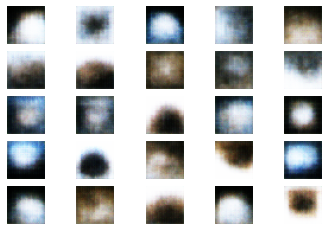

Guardando datos de la mixtura para CIFAR10-1024convoCluster
Historia del entrenamiento:


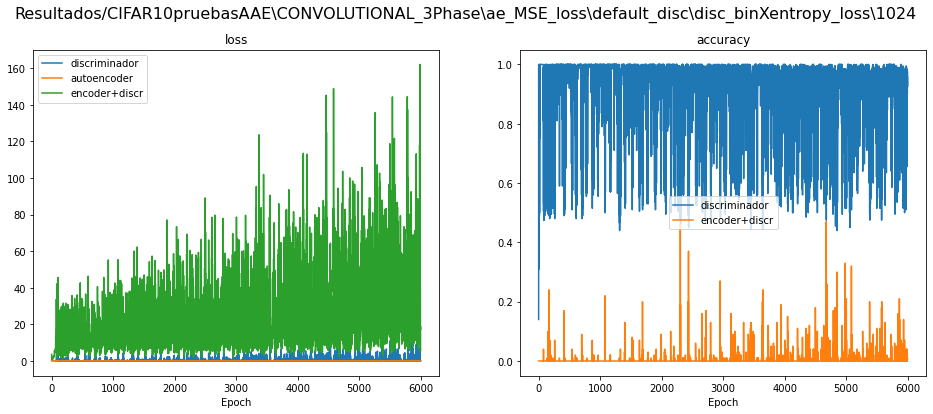

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


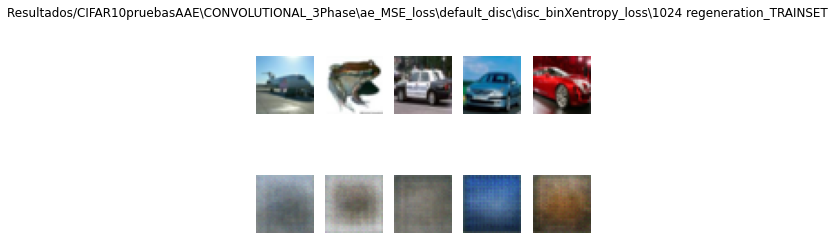

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


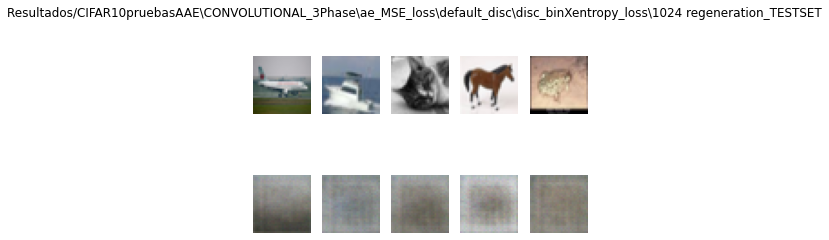

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


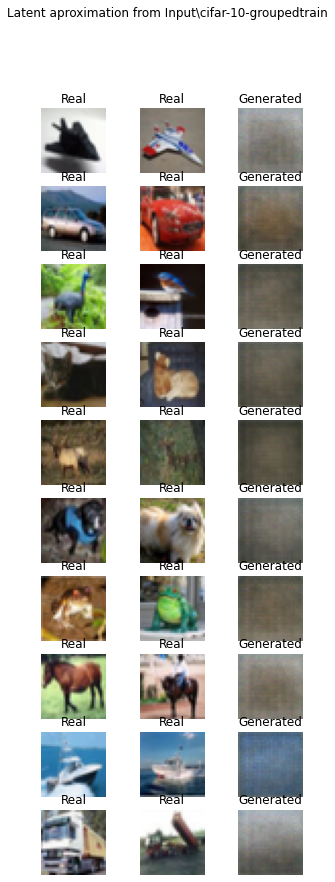

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


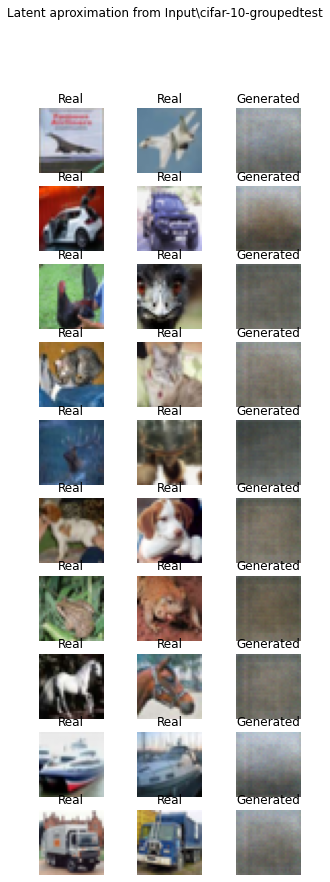

In [14]:
model_name = "CONVOLUTIONAL_3Phase"

encoder = (build_conv_encoder, "dense_enc", {})
decoder = (build_conv_decoder,"dense_dec", {})
for dim_latente in dim_latente_cand:
    tryModel(assemble_AAE=assemble_AAE_threePhased, fit_AAE=fit_AAE_threePhased,enc = encoder, dec=decoder, dim_latente=dim_latente, model_name=model_name, mixture_data={"override":True, "nombre":str(dim_latente)+"convoCluster"})


Con clases

Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C_3Phase\ae_MSE_loss\default_disc\disc_binXentropy_loss\512


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.000245, acc: 100.00%] AE: [loss: 0.055879] EN-DI [acc: 0.00%] 43.25s		
E1 <██████████> 100% DISC: [loss: 0.664624, acc: 73.50%] AE: [loss: 0.045911] EN-DI [acc: 0.00%] 42.46s		
E2 <██████████> 100% DISC: [loss: 0.040202, acc: 98.00%] AE: [loss: 0.043025] EN-DI [acc: 3.00%] 42.87s		
E3 <██████████> 100% DISC: [loss: 0.032871, acc: 99.00%] AE: [loss: 0.048782] EN-DI [acc: 0.00%] 41.80s		
E4 <██████████> 100% DISC: [loss: 0.116188, acc: 97.00%] AE: [loss: 0.046707] EN-DI [acc: 0.00%] 41.83s		
E5 <██████████> 100% DISC: [loss: 4.941332, acc: 46.50%] AE: [loss: 0.042338] EN-DI [acc: 0.00%] 42.44s		
E6 <██████████> 100% DISC: [loss: 0.071119, acc: 98.50%] AE: [loss: 0.039136] EN-DI [acc: 0.00%] 42.16s		
E7 <██████████> 100% DISC: [loss: 0.050608, acc: 98.50%] AE: [loss: 0.035617] EN-DI [acc: 0.00%] 41.75s		
E8 <██████████> 100% DISC: [loss: 0.341087, acc: 93.50%] AE: [loss: 0.035379] EN-DI [acc: 1.00%] 41.93s		
E9 <██████████> 100% DISC: [loss: 3.110187, a

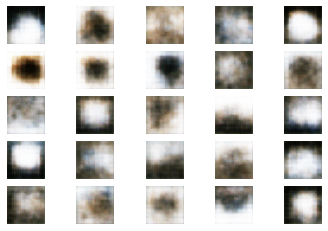

Guardando datos de la mixtura para CIFAR10-512convoCluster
Historia del entrenamiento:


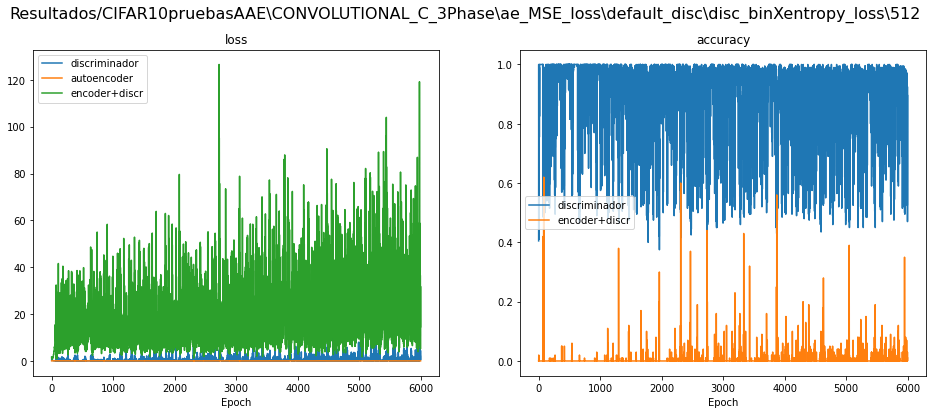

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


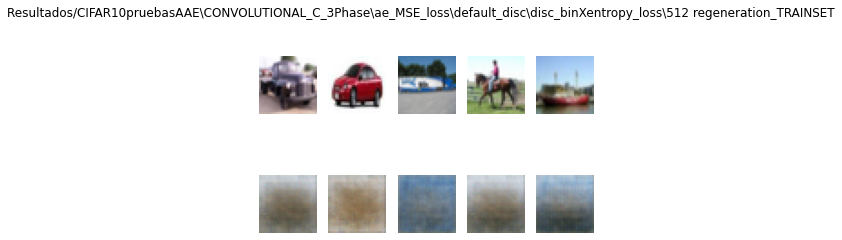

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


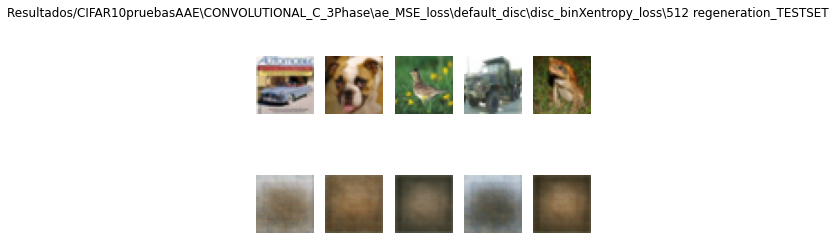

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


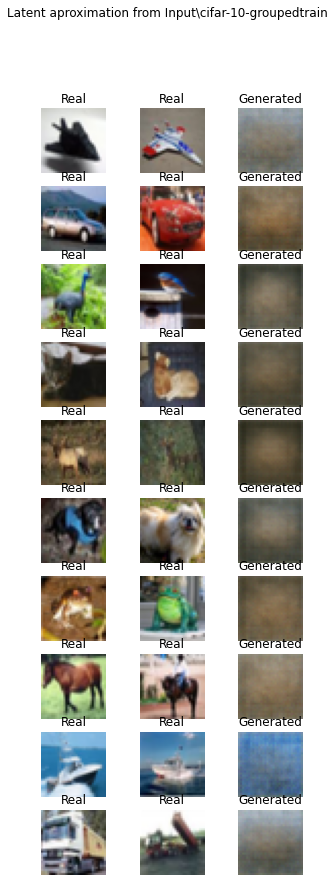

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


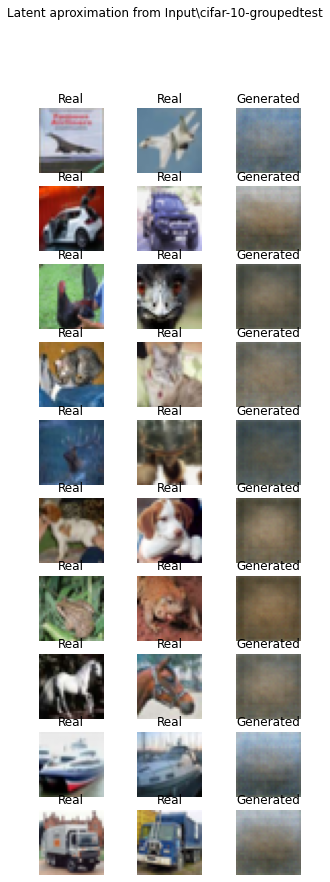

Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C_3Phase\ae_MSE_loss\default_disc\disc_binXentropy_loss\1024


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.027225, acc: 99.50%] AE: [loss: 0.057445] EN-DI [acc: 0.00%] 44.83s		
E1 <██████████> 100% DISC: [loss: 1.071881, acc: 57.00%] AE: [loss: 0.047587] EN-DI [acc: 0.00%] 43.91s		
E2 <██████████> 100% DISC: [loss: 0.076795, acc: 97.50%] AE: [loss: 0.058888] EN-DI [acc: 0.00%] 43.49s		
E3 <██████████> 100% DISC: [loss: 0.095858, acc: 97.00%] AE: [loss: 0.047202] EN-DI [acc: 0.00%] 43.46s		
E4 <██████████> 100% DISC: [loss: 0.019475, acc: 99.00%] AE: [loss: 0.037341] EN-DI [acc: 0.00%] 43.67s		
E5 <██████████> 100% DISC: [loss: 0.001685, acc: 100.00%] AE: [loss: 0.043126] EN-DI [acc: 0.00%] 43.59s		
E6 <██████████> 100% DISC: [loss: 0.003598, acc: 100.00%] AE: [loss: 0.039582] EN-DI [acc: 0.00%] 43.55s		
E7 <██████████> 100% DISC: [loss: 0.123889, acc: 97.50%] AE: [loss: 0.036539] EN-DI [acc: 0.00%] 44.01s		
E8 <██████████> 100% DISC: [loss: 0.133460, acc: 94.00%] AE: [loss: 0.042517] EN-DI [acc: 0.00%] 43.64s		
E9 <██████████> 100% DISC: [loss: 0.102513, 

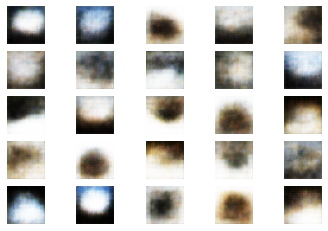

Guardando datos de la mixtura para CIFAR10-1024convoCluster
Historia del entrenamiento:


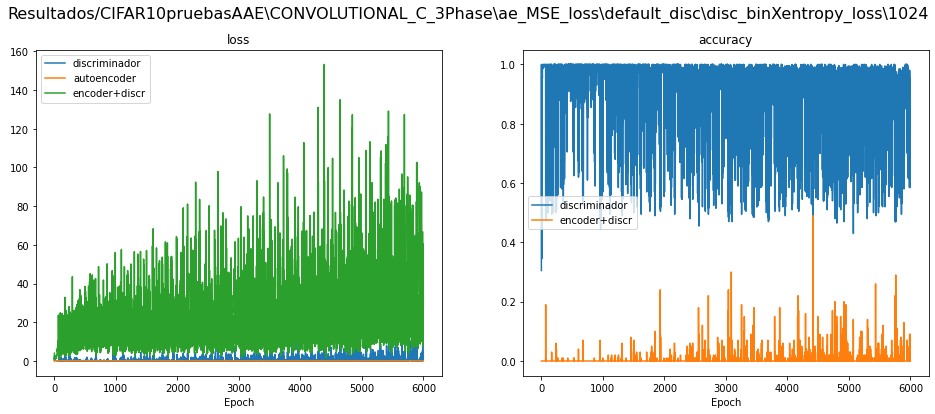

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


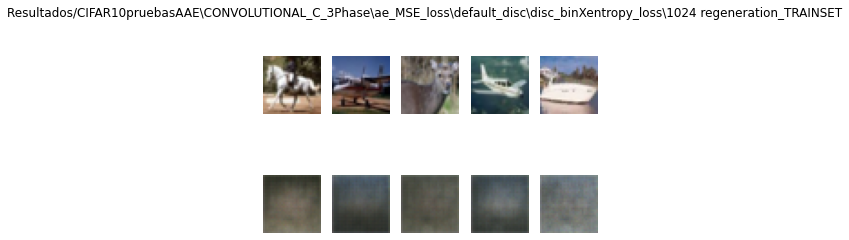

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


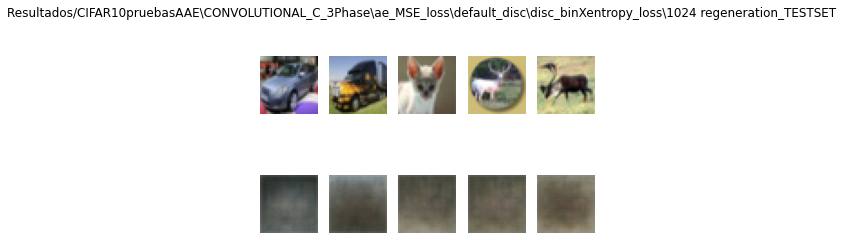

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


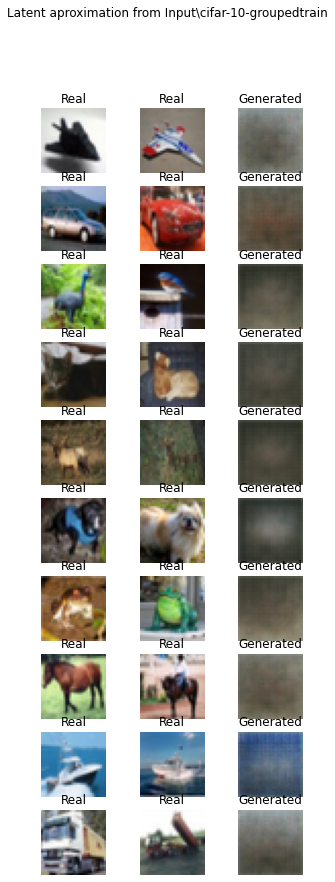

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


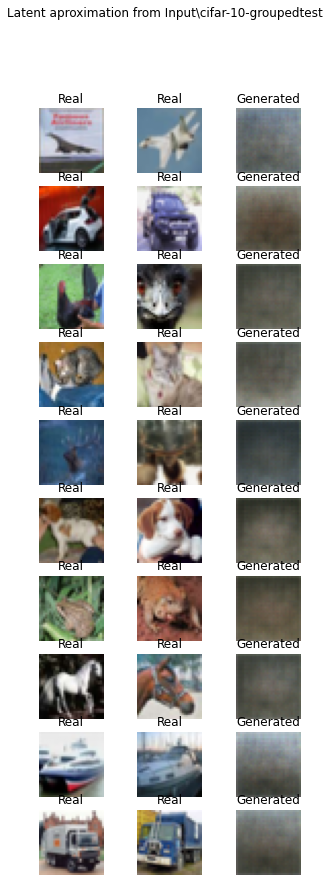

In [15]:
discriminator = (build_class_discriminator ,"class_disc",{"clases":10}, {"truth":true_sampler_clases, "truth_kwargs":{"nclases":10}, "falsehood":fake_class_sampler})
model_name = "CONVOLUTIONAL_C_3Phase"

encoder = (build_conv_encoder, "dense_enc", {})
decoder = (build_conv_decoder,"dense_dec", {})
for dim_latente in dim_latente_cand:
    tryModel(assemble_AAE=assemble_AAE_threePhased, fit_AAE=fit_AAE_threePhased,enc = encoder, dec=decoder, dim_latente=dim_latente, model_name=model_name, mixture_data={"override":True, "nombre":str(dim_latente)+"convoCluster"})

Con clases(cluster)

Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_Cluster_3Phase\ae_MSE_loss\default_disc\disc_binXentropy_loss\512


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.001957, acc: 100.00%] AE: [loss: 0.051134] EN-DI [acc: 0.00%] 43.68s		
E1 <██████████> 100% DISC: [loss: 0.047211, acc: 98.00%] AE: [loss: 0.052981] EN-DI [acc: 0.00%] 42.82s		
E2 <██████████> 100% DISC: [loss: 0.141812, acc: 93.50%] AE: [loss: 0.040669] EN-DI [acc: 0.00%] 42.93s		
E3 <██████████> 100% DISC: [loss: 0.048823, acc: 98.00%] AE: [loss: 0.042869] EN-DI [acc: 0.00%] 41.97s		
E4 <██████████> 100% DISC: [loss: 0.037550, acc: 99.00%] AE: [loss: 0.041948] EN-DI [acc: 0.00%] 42.30s		
E5 <██████████> 100% DISC: [loss: 0.084396, acc: 96.50%] AE: [loss: 0.044458] EN-DI [acc: 0.00%] 42.18s		
E6 <██████████> 100% DISC: [loss: 0.100407, acc: 98.00%] AE: [loss: 0.049444] EN-DI [acc: 0.00%] 42.06s		
E7 <██████████> 100% DISC: [loss: 0.179314, acc: 97.00%] AE: [loss: 0.040324] EN-DI [acc: 0.00%] 41.94s		
E8 <██████████> 100% DISC: [loss: 0.200358, acc: 96.00%] AE: [loss: 0.035847] EN-DI [acc: 0.00%] 42.04s		
E9 <██████████> 100% DISC: [loss: 0.046494, a

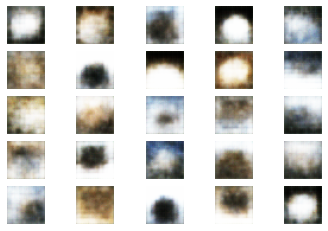

Guardando datos de la mixtura para CIFAR10-512convoCluster
Historia del entrenamiento:


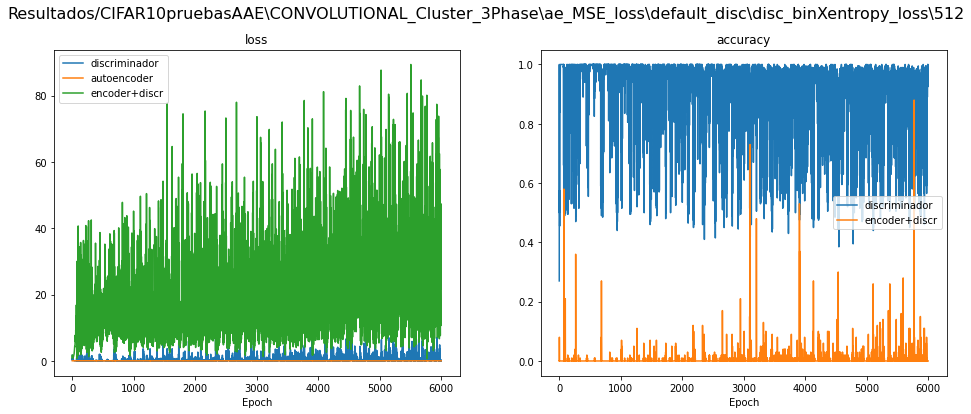

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


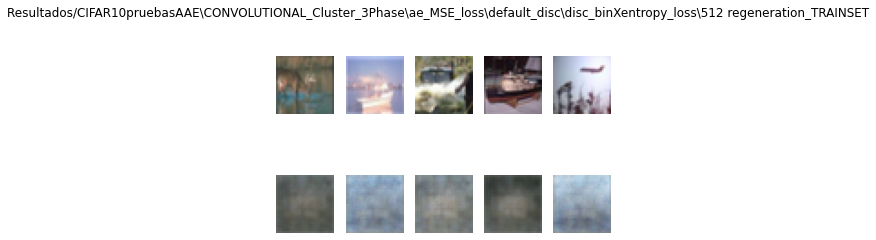

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


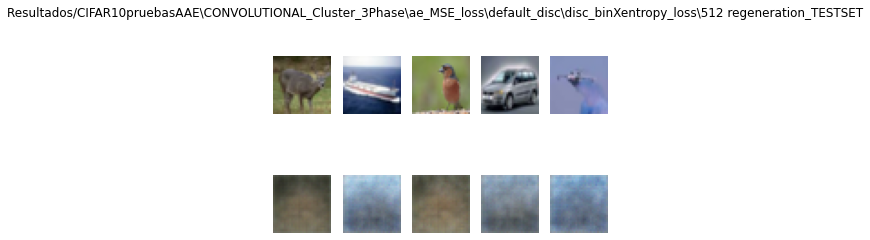

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


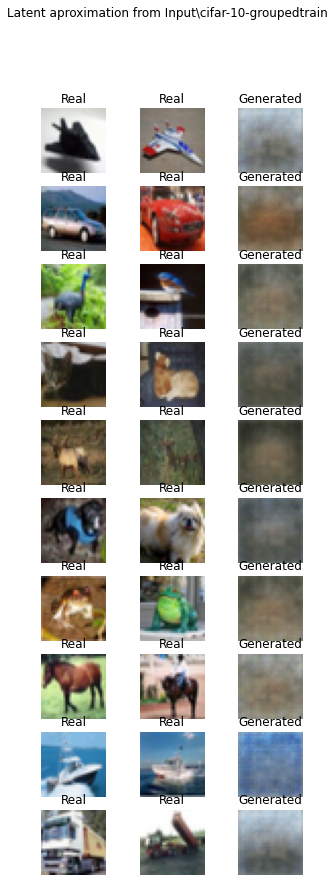

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


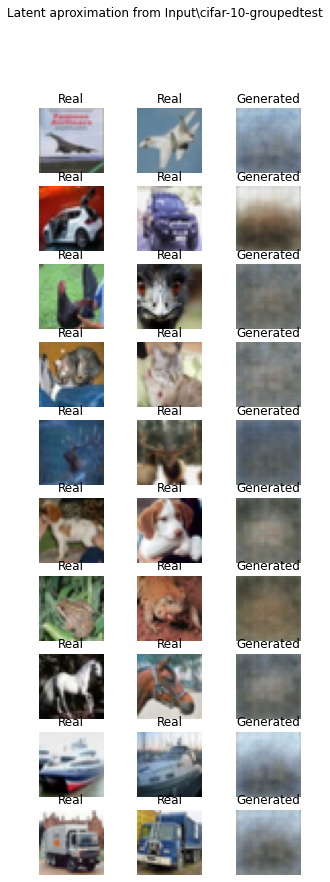

Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_Cluster_3Phase\ae_MSE_loss\default_disc\disc_binXentropy_loss\1024


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.010008, acc: 99.50%] AE: [loss: 0.050655] EN-DI [acc: 0.00%] 44.96s		
E1 <██████████> 100% DISC: [loss: 0.605606, acc: 80.00%] AE: [loss: 0.046766] EN-DI [acc: 0.00%] 44.19s		
E2 <██████████> 100% DISC: [loss: 0.012593, acc: 99.50%] AE: [loss: 0.045940] EN-DI [acc: 0.00%] 43.82s		
E3 <██████████> 100% DISC: [loss: 0.063069, acc: 97.00%] AE: [loss: 0.046189] EN-DI [acc: 0.00%] 43.71s		
E4 <██████████> 100% DISC: [loss: 0.157506, acc: 94.00%] AE: [loss: 0.038460] EN-DI [acc: 0.00%] 44.35s		
E5 <██████████> 100% DISC: [loss: 0.320318, acc: 91.00%] AE: [loss: 0.041280] EN-DI [acc: 0.00%] 43.99s		
E6 <██████████> 100% DISC: [loss: 0.001442, acc: 100.00%] AE: [loss: 0.038136] EN-DI [acc: 0.00%] 44.05s		
E7 <██████████> 100% DISC: [loss: 0.028826, acc: 99.00%] AE: [loss: 0.042320] EN-DI [acc: 0.00%] 43.77s		
E8 <██████████> 100% DISC: [loss: 0.001270, acc: 100.00%] AE: [loss: 0.035687] EN-DI [acc: 0.00%] 43.65s		
E9 <██████████> 100% DISC: [loss: 0.015104, 

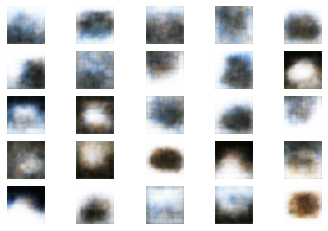

Guardando datos de la mixtura para CIFAR10-1024convoCluster
Historia del entrenamiento:


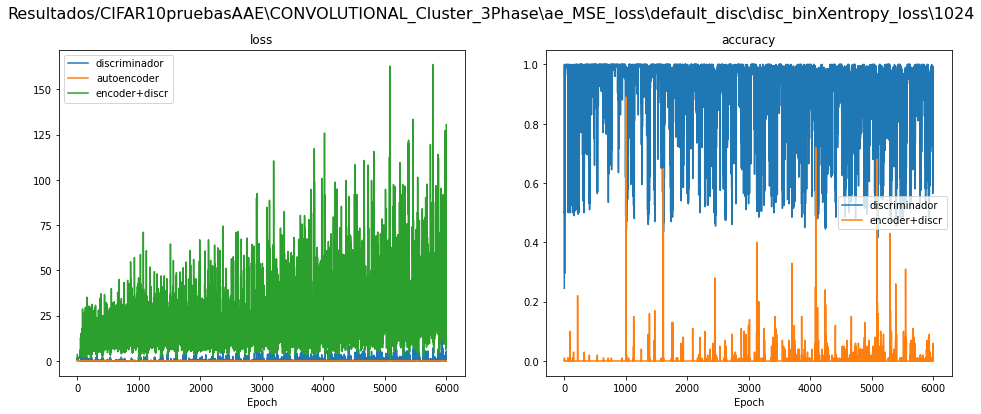

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


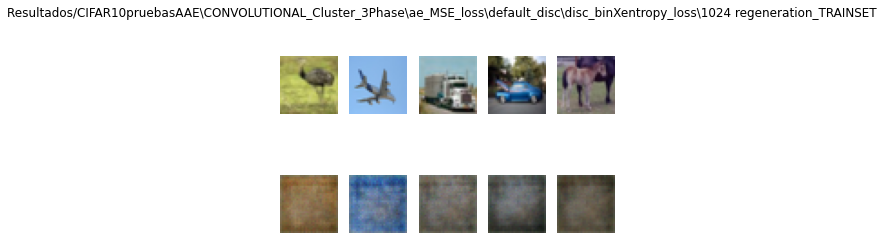

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


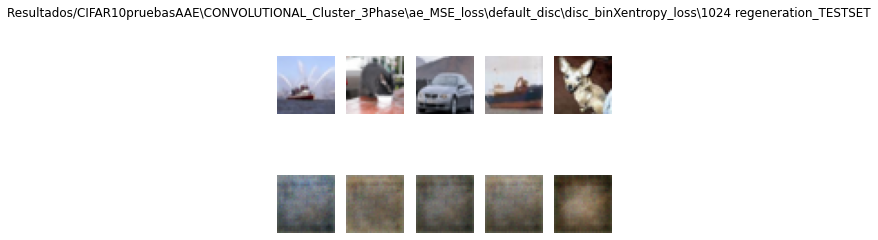

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


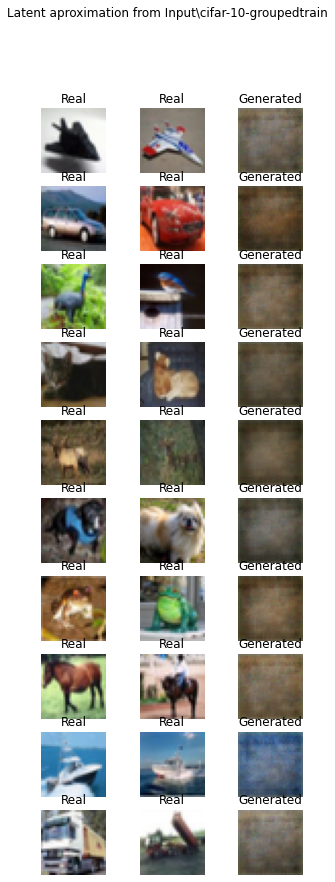

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


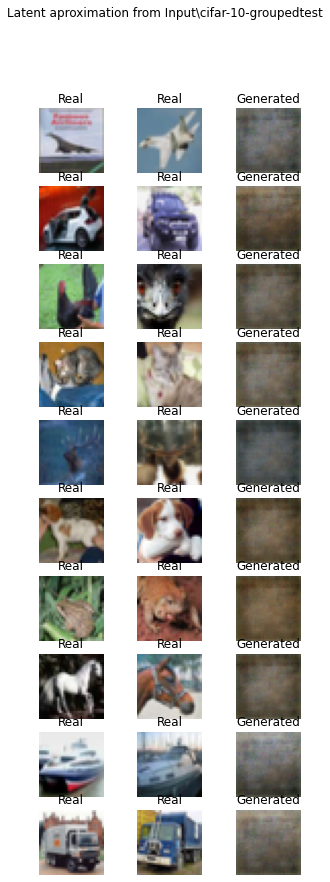

In [16]:

discriminator = (build_class_discriminator ,"class_disc",{"clases":10}, {"truth":genFromMixture, "truth_kwargs":{"nclases":10}, "falsehood":fake_class_sampler})
model_name = "CONVOLUTIONAL_Cluster_3Phase"

encoder = (build_conv_encoder, "dense_enc", {})
decoder = (build_conv_decoder,"dense_dec", {})
for dim_latente in dim_latente_cand:
    tryModel(assemble_AAE=assemble_AAE_threePhased, fit_AAE=fit_AAE_threePhased,enc = encoder, dec=decoder, dim_latente=dim_latente, model_name=model_name, mixture_data={"override":True, "nombre":str(dim_latente)+"convoCluster"})